In [16]:
import numpy as np
import random
import torch
import os
import glob
import torch
import albumentations as A
from albumentations.pytorch import ToTensorV2

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
def seed_everythig(seed):
    np.random.seed(seed)
    random.seed(seed)
    os.environ["GLOBALSEED"] = str(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True

In [4]:
seed_everythig(2233)

# Create dataset

In [5]:
import json
import os
import shutil
from tqdm.notebook import tqdm
import yaml
import numpy as np
import os, os.path
import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt

In [6]:
class SDataset:
    def __init__(self, images_path: str, annotations_filepath: str,
                imdata_path: str, dataset_name: str = "SHdataset",
               num_classes:int = 3, image_size = (512, 512), allow_unlabeled:bool = False,
                split_mask_to_instances:bool = False):
        # Inputs:
        #   images_path - path to image directory
        #   annotation_path - path to images annotation file
        #   imdata_path - path to file containing data about images
        self.allow_unlabeled = allow_unlabeled
        self.split_mask_to_instances = split_mask_to_instances
        self.dataset_name = dataset_name
        self.image_size = image_size
        self.images_path = images_path
        self.annotations_filepath = annotations_filepath
        self.imdata_path = imdata_path

        self.dataset_dirpath = os.path.join(os.getcwd(), self.dataset_name)

        self.labeled_dirpath =  os.path.join(self.dataset_dirpath, "labeled")
        if self.allow_unlabeled:
            self.unlabeled_dirpath =  os.path.join(self.dataset_dirpath, "unlabeled")

        self.sample_data = pd.read_csv(imdata_path)
        self.num_classes = num_classes

        self.classes_dict = {
            "blood_vessel": 0,
            "glomerulus": 1,
            "unsure": 2,
        }

        self.polygons = dict((item['id'], item) for item
                             in self.parse_jsonl(annotations_filepath))


    def parse_jsonl(self, path: str) -> list[dict]:
        with open(path, 'r') as json_file:
            jsonl_samples = [
                json.loads(line)
                for line in tqdm(
                    json_file, desc="Processing polygons"
                )
            ]
        print("Found " + str(len(jsonl_samples))+ " samples containing polygons.")
        return jsonl_samples


    def __prepare_dirs(self) -> None:
        # Create structure for coco dataset
        if not os.path.exists(self.dataset_dirpath):
            os.makedirs(os.path.join(self.labeled_dirpath, "images"), exist_ok=True)
            os.makedirs(os.path.join(self.labeled_dirpath, "masks"), exist_ok=True)
            if self.split_mask_to_instances:
                os.makedirs(os.path.join(self.labeled_dirpath, "instances"), exist_ok=True)
            if self.allow_unlabeled:
                os.makedirs(os.path.join(self.unlabeled_dirpath, "images"), exist_ok=True)
        else:
            raise RuntimeError()


    @staticmethod
    def __copy_image(source: str, destination:str) -> str:
        shutil.copyfile(
          source,
          destination
        )


    @staticmethod
    def __save_mask(dst_path:str, file_name:str, mask: np.ndarray) -> None:
        np.save(os.path.join(dst_path,file_name), mask)


    def __instances_from_annotation(self, annotations: dict,
                         size: tuple[int, int])->np.ndarray:
        masks = {
        0: [],
        1: [],
        2: []
        }
        for annotation in annotations:
            mask = Image.new(mode='1', size=size)
            en_type = self.classes_dict[annotation["type"]]
            coords = np.ravel(np.array(annotation["coordinates"][0]))
            ImageDraw.Draw(mask, '1').polygon(coords.tolist(), fill=(1))
            masks[en_type].append(np.array(mask))
        return np.array(masks)

    def __mask_from_annotation(self, annotations: dict,
                             size: tuple[int, int])->np.ndarray:
        masks = [Image.new(mode='1', size=size) for i in range(self.num_classes)]
        for annotation in annotations:
            en_type = self.classes_dict[annotation["type"]]
            coords = np.ravel(np.array(annotation["coordinates"][0]))
            ImageDraw.Draw(masks[en_type], '1').polygon(coords.tolist(), fill=(1))
        return np.stack([np.array(mask) for mask in masks], axis=2).astype(float)


    def __split_folders(self)->None:
        if self.allow_unlabeled:
            pbar = tqdm(desc="Preparing data", total=self.sample_data.shape[0])
        else:
            pbar = tqdm(desc="Preparing data", total=len(self.polygons))

        for sample_id, sample_dataset in zip(self.sample_data['id'],
                                             self.sample_data['dataset']):
            impath = os.path.join(self.images_path, f"{sample_id}.tif")
            if sample_dataset in [1, 2]:
                dest_path = self.labeled_dirpath
            elif sample_dataset == 3:
                if self.allow_unlabeled:
                    dest_path = self.unlabeled_dirpath
                else: continue
            else:
                raise RuntimeError(f"Unknown sample dataset for sample {sample_id}")

            self.__copy_image(impath, os.path.join(dest_path, "images", f"{sample_id}.tif"))

            if sample_dataset in [1,2]:
                annotations = self.polygons.get(sample_id).get("annotations")
                mask = self.__mask_from_annotation(annotations, self.image_size)
                self.__save_mask(os.path.join(dest_path, "masks"), sample_id, mask)
                if self.split_mask_to_instances:
                    instances = self.__instances_from_annotation(annotations, self.image_size)
                    self.__save_mask(os.path.join(dest_path, "instances"), sample_id, instances)
            pbar.update(1)
        pbar.close()


    def __count_dataset(self) -> dict:
        labeled_images = len(os.listdir(os.path.join(self.labeled_dirpath, "images")))
        labeled_masks = len(os.listdir(os.path.join(self.labeled_dirpath, "masks")))
        if self.allow_unlabeled:
            unlabeled_images = len(os.listdir(os.path.join(self.unlabeled_dirpath, "images")))
            return {
                "labeled_images": labeled_images,
                "labeled_masks": labeled_masks,
                "unlabeled_images": unlabeled_images
            }
        else:
            return {
                "labeled_images": labeled_images,
                "labeled_masks": labeled_masks
            }


    @staticmethod
    def print_dataset(dataset:dict)->None:
        for k in dataset:
            print(f"{k}: {dataset[k]}\n")

    @staticmethod
    def __check_sanity(count_dict: dict) -> None:
        assert count_dict["labeled_images"] == count_dict["labeled_masks"]


    def create_dataset(self):
        try:
            self.__prepare_dirs()
        except RuntimeError:
            inp = input("Dataset with name "+self.dataset_name+" already exists.\n"+
                          "Do you want to override old dataset? y/n \n")
            if inp == "y":
                shutil.rmtree(self.dataset_name)
                self.__prepare_dirs()
            else: raise RuntimeError("Dataset already exists!")

        self.__split_folders()
        count_dict = self.__count_dataset()
        self.__check_sanity(count_dict)
        self.print_dataset(count_dict)

    def create_dataset(self):
        try:
            self.__prepare_dirs()
        except RuntimeError:
            inp = input("Dataset with name "+self.dataset_name+" already exists.\n"+
                          "Do you want to override old dataset? y/n \n")
            if inp == "y":
                shutil.rmtree(self.dataset_name)
                self.__prepare_dirs()
            else: raise RuntimeError("Dataset already exists!")

        self.__split_folders()
        count_dict = self.__count_dataset()
        self.__check_sanity(count_dict)
        self.print_dataset(count_dict)


In [10]:
ds = SDataset(
    annotations_filepath="/kaggle/input/hubmap-hacking-the-human-vasculature/polygons.jsonl",
    images_path = "/kaggle/input/hubmap-hacking-the-human-vasculature/train",
    imdata_path = "/kaggle/input/hubmap-hacking-the-human-vasculature/tile_meta.csv"
)

ds.create_dataset()

Processing polygons: 0it [00:00, ?it/s]

Found 1633 samples containing polygons.


Preparing data:   0%|          | 0/1633 [00:00<?, ?it/s]

labeled_images: 1633

labeled_masks: 1633



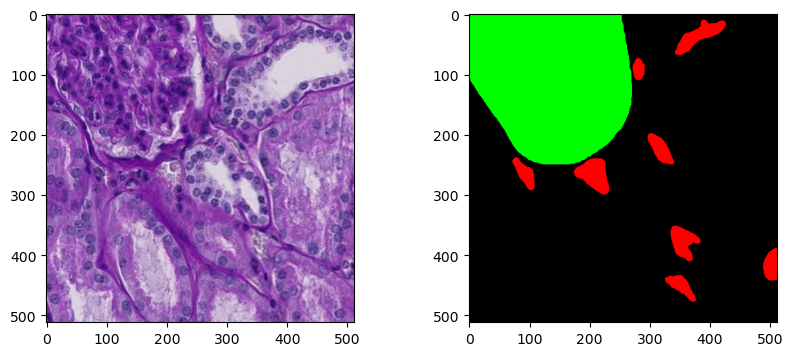

In [11]:
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import numpy as np
fig, ax = plt.subplots(1,2, figsize = (10, 4))
im = Image.open('SHdataset/labeled/images/0006ff2aa7cd.tif')
mask = np.load("SHdataset/labeled/masks/0006ff2aa7cd.npy")
ax[0].imshow(im)
ax[1].imshow(mask)
plt.show()

# Dataset and dataloader

In [12]:
import os
import glob
import torch
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import numpy as np

class LabeledDataset(torch.utils.data.Dataset):

    def __init__(self, image_paths: list[str], mask_paths: list[str], transform=None,
                 classes: list[int]=[0, 1, 2]):

        self.classes = classes

        self.transforms = transform

        self.image_paths = image_paths
        self.mask_paths = mask_paths
        
    @classmethod
    def from_root(cls, root:str, transform=None,
                 classes: list[int]=[0, 1, 2], max_size:int=None):
        image_paths = sorted(glob.glob(os.path.join(root,'images','*.tif')))
        mask_paths = sorted(glob.glob(os.path.join(root,'masks','*.npy')))
        if max_size:
            image_paths = image_paths[0:max_size]
            mask_paths= mask_paths[0:max_size]

        assert len(image_paths) == len(mask_paths)
        return cls(image_paths, mask_paths, transform=transform, classes=classes)
        
    @classmethod
    def from_paths(cls, image_paths: list[str], mask_paths: list[str],
                   transform=None, classes: list[int]=[0, 1, 2],):
        image_paths = sorted(image_paths)
        mask_paths = sorted(mask_paths)

        assert len(image_paths) == len(mask_paths)
        return cls(image_paths, mask_paths, transform=transform, classes=classes)

    def __len__(self):
        return len(self.image_paths)

    @staticmethod
    def create_semantic_masks(mask:np.ndarray, size:tuple[int, int]=(512, 512))->np.ndarray:
        semantic_masks = []
        for key, value in mask.tolist().items():
            if value:
                semantic_masks.append(np.sum(value, axis=0))
            else:
                semantic_masks.append(np.zeros(size))
        return np.array(semantic_masks)


    def __getitem__(self, index: int)->tuple[np.ndarray, np.ndarray]:
        img = np.array(Image.open(self.image_paths[index]))
        mask = np.take(np.load(self.mask_paths[index]), self.classes, axis = 2)
        #mask = np.load(self.mask_paths[index])
        #if len(self.classes) == 1:
         #   mask = np.squeeze(mask)
        if self.transforms is not None:
            augmented = self.transforms(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']
        return img, mask

In [24]:
def get_datasets(root: str, shuffle: bool = False, transforms = (None, None),
                classes: list[int] = [0,1,2], sizes:tuple[int,int] = None
                ) -> tuple[LabeledDataset, LabeledDataset]:

    image_paths = sorted(glob.glob(os.path.join(root,'images','*.tif')))
    mask_paths = sorted(glob.glob(os.path.join(root,'masks','*.npy')))
    assert len(image_paths) == len(mask_paths)
          
    if shuffle:
        _temp = list(zip(image_paths, mask_paths))
        random.shuffle(_temp)
        image_paths, mask_paths = [list(paths) for paths in zip(*_temp)]

    d_len = len(image_paths)

    if sizes:
        assert sizes[0] + sizes[1] <= d_len
    else:
        sizes = [int(0.8 * d_len), d_len - int(0.8 * d_len)]
        assert sizes[0] + sizes[1] == d_len

    train_l_dataset = LabeledDataset.from_paths(image_paths[0:sizes[0]], 
                                                mask_paths[0:sizes[0]],
                                                transform = transforms[0],
                                                classes = classes)

    train_v_dataset = LabeledDataset.from_paths(image_paths[sizes[0]:sizes[0]+sizes[1]],
                                                mask_paths[sizes[0]:sizes[0]+sizes[1]], 
                                                transform = transforms[0], 
                                                classes = classes)
    return train_l_dataset, train_v_dataset
        

In [30]:
def get_mean_std(num_channels:int)->tuple[np.ndarray, np.ndarray]:
    transform_data_mean_std = A.Compose([
      ToTensorV2()
    ])
    labeled_data = LabeledDataset.from_root(root = '/kaggle/working/SHdataset/labeled')
    full_loader = torch.utils.data.DataLoader(labeled_data)

    mean = torch.zeros(num_channels)
    std = torch.zeros(num_channels)

    for inputs, _ in tqdm(full_loader, desc = "Computing mean and std"):
        inputs = inputs.float()
        for i in range(num_channels):
            mean[i] += inputs[:,:,:,i].mean()
            std[i] += inputs[:,:,:,i].std()
    mean.div_(len(full_loader))
    std.div_(len(full_loader))
    print("Found mean: ", mean.div_(255.0))
    print("Found std: ", std.div_(255.0))
    return np.array(mean.div_(255.0)), np.array(std.div_(255.0))

In [31]:
mean, std = get_mean_std(3)

Computing mean and std:   0%|          | 0/1633 [00:00<?, ?it/s]

Found mean:  tensor([0.6304, 0.4166, 0.6861])
Found std:  tensor([0.1457, 0.1963, 0.1234])


In [32]:
train_transforms = A.Compose([
    A.augmentations.crops.transforms.CropNonEmptyMaskIfExists(224, 224, always_apply=True, p=1.0),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.Normalize(mean=mean, std=std),
    ToTensorV2(transpose_mask = True)
])

val_transforms = A.Compose([
    A.augmentations.crops.transforms.CropNonEmptyMaskIfExists(224, 224, always_apply=True, p=1.0),
    A.Normalize(mean=mean, std=std),
    ToTensorV2(transpose_mask = True)
])

## Metrics
thanks to: https://www.kaggle.com/code/bigironsphere/loss-function-library-keras-pytorch/notebook

In [43]:
import torch.nn as nn
import torch.nn.functional as F
from typing import Optional

class IoU(nn.Module):
    def __init__(self, weight=None, size_average=True, add_sigmoid = False):
        self.add_sigmoid = add_sigmoid
        super(IoU, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        if self.add_sigmoid:
            inputs = F.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.contiguous().flatten()
        targets = targets.contiguous().flatten()

        #intersection is equivalent to True Positive count
        #union is the mutually inclusive area of all labels & predictions
        intersection = (inputs * targets).sum()
        total = (inputs + targets).sum()
        union = total - intersection

        IoU = (intersection + smooth)/(union + smooth)

        return IoU


class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True, add_sigmoid = False):
        self.add_sigmoid = add_sigmoid
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        if self.add_sigmoid:
            inputs = F.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice


class DiceBCELoss(nn.Module):
    def __init__(self, weight=None, size_average=True, add_sigmoid = False):
        self.add_sigmoid = add_sigmoid
        super(DiceBCELoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        if self.add_sigmoid:
            inputs = F.sigmoid(inputs)
        #flatten label and prediction tensors
        #flatten label and prediction tensors
        inputs = inputs.view(-1).to(dtype=torch.float32)
        targets = targets.view(-1).to(dtype=torch.float32)

        intersection = (inputs * targets).sum()
        dice_loss = 1 - (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)
        BCE = F.binary_cross_entropy(inputs, targets, reduction='mean')
        Dice_BCE = BCE + dice_loss

        return Dice_BCE

####################
ALPHA = 0.7
BETA = 0.3
GAMMA = 4/3
class FocalTverskyLoss(nn.Module):
    def __init__(self, weight=None, size_average=True, add_sigmoid = False):
        self.add_sigmoid = add_sigmoid
        super(FocalTverskyLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1, alpha=ALPHA, beta=BETA, gamma=GAMMA):

        if self.add_sigmoid:
            inputs = F.sigmoid(inputs)

        #flatten label and prediction tensors
        inputs = inputs.contiguous().flatten()
        targets = targets.contiguous().flatten()

        #True Positives, False Positives & False Negatives
        TP = (inputs * targets).sum()
        FP = ((1-targets) * inputs).sum()
        FN = (targets * (1-inputs)).sum()

        Tversky = (TP + smooth) / (TP + alpha*FP + beta*FN + smooth)
        FocalTversky = (1 - Tversky)**gamma

        return FocalTversky

# Training

In [34]:
import numpy as np
import random
import torch
import os
import gc
import time
from collections import defaultdict
from tqdm.notebook import tqdm

In [35]:
def metrics_description(metrics:dict, epoch_samples: int, phase:str)->str:
    outputs = phase + ": ||"
    for k in metrics.keys():
        outputs += (" {}: {:4f} ||".format(k, metrics[k] / epoch_samples))
    return outputs

In [36]:
def reverse_transform(inp: np.ndarray, im_type: str, mean: np.ndarray=None,
                      std: np.ndarray=None):
    inp = inp.permute(1, 2, 0).numpy()
    if im_type == 'img':
        inp = std * inp + mean
        inp = np.clip(inp, 0, 1)
        inp = (inp * 255).astype(np.uint8)
    return inp

In [57]:
def train(model:nn.Module, model_name:str, dataset_root:str, epochs:int =20, checkpoints:bool = False,
          checkpoint_interval = 5, plot_example_after_epoch:bool = True, classes:int = [0,1,2]):
    try:
        gc.collect()
        torch.cuda.empty_cache()
    except:
        pass

    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
    model = model().to(device)
    epochs = epochs
    model_name = model_name
    num_classes = len(classes)
    ##############################################################################
                              ## Saving setting ##
    if checkpoints:
        checkpoints_path = os.path.join(os.getcwd(), "checkpoints_"+model_name)


    ##############################################################################
                              ## set up loss and metric ##
    FT =  FocalTverskyLoss(add_sigmoid=True).to(device)
    jaccard = IoU(add_sigmoid=True).to(device)
    diceBCE = DiceBCELoss(add_sigmoid=True).to(device)
    dice = DiceLoss(add_sigmoid=True).to(device)
    best_loss = 1e10
    
    metric_list = {'train': [],
                   'val': [],
                   'samples': []}
    ##############################################################################
                              ## LOAD DATASETS ##
    t_loader, v_loader = get_datasets(
        root = dataset_root,
        shuffle = True,
        transforms = (train_transforms, val_transforms),
        classes=classes,
        sizes = None
        )
    labeled_loaders = {
        'train':  torch.utils.data.DataLoader(t_loader, batch_size=1, shuffle=True),
        'val': torch.utils.data.DataLoader(v_loader, batch_size=1, shuffle=True)
    }

    ##############################################################################
                          ## OPTIMIZER AND SHELDUER ##

    optimizer = torch.optim.Adam(model.parameters(), lr= 1e-4)

    scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer=optimizer, pct_start=0.1, div_factor=1e2,
                                            max_lr=1e-3, epochs=epochs, steps_per_epoch=len(labeled_loaders["train"]))


  #############################################################################
    print(" ____________________________________________________________")
    print("|                          Training                          |")
    print("|____________________________________________________________|")

    for epoch in range(epochs):
        print(f"Epoch {epoch+1}/{epochs}: ")
        since = time.time()
        #Each epoch has a training and validation phase
        for phase in ['train','val']: #, 'val'
            print("Phase: "+ phase)
            # Set model to phase
            if phase == 'train':
                model.train()  # Set model to training mode
            else:
                model.eval()   # Set model to evaluate mode

            metrics = defaultdict(float)
            epoch_samples = 0
            with tqdm(labeled_loaders[phase], unit = "batch",
                    total = len(labeled_loaders[phase])) as tepoch:
                for inputs, labels in labeled_loaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(torch.double).to(device)
                    # zero the parameter gradients
                    optimizer.zero_grad()
                    # forward
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        FT_l =  FT(outputs, labels)
                        iou = jaccard(outputs, labels)
                        dbce_l = diceBCE(outputs, labels)
                        dice_l = dice(outputs, labels)
                    loss = 2*(1.0-iou) + dbce_l
                    
                    metrics['loss'] += loss.clone().detach().cpu().numpy()
                    metrics['dice'] += dice_l.clone().detach().cpu().numpy()
                    metrics['diceBCE'] += dbce_l.clone().detach().cpu().numpy()
                    metrics['IoU']  += iou.clone().detach().cpu().numpy()
                    metrics['FT']  += FT_l.clone().detach().cpu().numpy()
                    
                    # backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        scheduler.step()

                    epoch_samples += inputs.size(0)
                    tepoch.set_description(metrics_description(metrics,
                                                              epoch_samples,
                                                              phase))
                    tepoch.update(inputs.size(0))
            
            metric_list[phase].append(metrics)
            print(metrics_description(metrics, epoch_samples, phase))
            print("-----"*10)
        metric_list['samples'].append(epoch_samples)
        epoch_loss = metrics['FT'] / epoch_samples

        if plot_example_after_epoch:
            for inputs, labels in labeled_loaders["val"]:
                inputs = inputs.to(device)
                with torch.set_grad_enabled(False):
                    outputs = model(inputs)
                    fig, ax = plt.subplots(1,2+num_classes, figsize = (5+5*num_classes,5))
                    ax[0].imshow(reverse_transform(inputs[0].cpu(), 'img', mean, std))
                    ax[1].imshow(labels[0].permute(1,2,0))
                    outs = reverse_transform(outputs[0].cpu(), 'mask')
                    if len(outs.shape) == 2:
                        ax[2].imshow(outs)
                    else:
                        for i in range(num_classes):        
                            ax[2+i].imshow(outs[:,:,i])
                    plt.show()
                break

        if epoch_loss < best_loss:
            best_loss = epoch_loss
        if checkpoints and (epoch % checkpoint_interval==0):
            os.makedirs(os.path.join(checkpoints_path,str(epoch),"model_params"), exist_ok=True)
            os.makedirs(os.path.join(checkpoints_path,str(epoch),"optim"), exist_ok=True)
            os.makedirs(os.path.join(checkpoints_path,str(epoch),"dataloader"), exist_ok=True)
            os.makedirs(os.path.join(checkpoints_path,str(epoch),"losses"), exist_ok=True)

            torch.save(model.state_dict(), os.path.join(checkpoints_path,str(epoch),
                                                      "model_params",
                                                      model_name+'_parameters.pt'))

            torch.save(optimizer, os.path.join(checkpoints_path,str(epoch),
                                             "optim", 'optim.pth'))
            torch.save(scheduler, os.path.join(checkpoints_path,str(epoch),
                                             "optim", 'sheld.pth'))

            torch.save(t_loader, os.path.join(checkpoints_path,str(epoch),
                                            "dataloader","train_dataset.pth"))
            torch.save(t_loader, os.path.join(checkpoints_path,str(epoch),
                                            "dataloader","val_dataset.pth"))

            torch.save(FT, os.path.join(checkpoints_path,str(epoch),
                                      "losses","FT.pt"))
            torch.save(IoU, os.path.join(checkpoints_path,str(epoch),
                                      "losses","IoU.pt"))


        time_elapsed = time.time() - since
        print('{:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))
        print("#####"*10)

    print('Best validation loss: {:4f}'.format(best_loss))

    return model, metric_list

# Model

In [38]:
!pip install timm==0.6.11
!git clone https://github.com/sail-sg/metaformer.git

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 548.7/548.7 kB 14.8 MB/s eta 0:00:0000:01
  Attempting uninstall: timm
    Found existing installation: timm 0.9.2
    Uninstalling timm-0.9.2:
      Successfully uninstalled timm-0.9.2
Cloning into 'metaformer'...
remote: Enumerating objects: 205, done.
remote: Counting objects: 100% (205/205), done.
remote: Compressing objects: 100% (86/86), done.
remote: Total 205 (delta 146), reused 173 (delta 118), pack-reused 0
Receiving objects: 100% (205/205), 364.53 KiB | 10.13 MiB/s, done.
Resolving deltas: 100% (146/146), done.


In [39]:
import torch
import timm
import torch.nn as nn
from functools import partial
import torch.nn.functional as F
from metaformer import metaformer_baselines as mb

In [40]:
class Conv(nn.Module):
    def __init__(self, dim_in, dim_out, kernel_size = 3, padding = 0):
        super().__init__()
        self.pre_permute = False
        if kernel_size == 1:
            self.conv = nn.Linear(dim_in, dim_out, bias=False)
        else:
            self.pre_permute = True
            self.conv = nn.Conv2d(dim_in, dim_out, kernel_size=kernel_size,
                                  padding=padding, bias=False)

        self.normalization = nn.BatchNorm2d(dim_out)
        self.activation = nn.SiLU()

    def forward(self, input):
        if self.pre_permute:
            x = self.conv(input.permute(0,3,1,2))
        else:
            x = self.conv(input).permute(0,3,1,2)

        x = self.normalization(x).permute(0, 2, 3, 1)
        x = self.activation(x)
        return x

class Head(nn.Module):
    def __init__(self, dim_in, middle_chanes, dim_out, num_classes):
        super().__init__()
        self.conv1 = Conv(dim_in,  middle_chanes, kernel_size = 3, padding = 1)
        self.conv2 = Conv( middle_chanes, dim_out, kernel_size = 3, padding = 1)
        self.conv3 = nn.Linear(dim_out, num_classes, bias=False)
    def forward(self, input):
        x = self.conv1(input)
        x = self.conv2(x)
        x = self.conv3(x)
        return x

class Connector(nn.Module):
    def __init__(self, dim_in, dim_out):
        super().__init__()
        self.split_dim = dim_out//2
        self.pwconv1 = Conv(dim_in, dim_out, kernel_size = 1)
        self.dwconv1 = nn.Conv2d(self.split_dim, self.split_dim//2, kernel_size=3,
                            padding=1, bias=False)
        self.dwconv2 = nn.Conv2d(self.split_dim//2, self.split_dim, kernel_size=3,
                        padding=1, bias=False)
        self.pwconv2 = Conv(dim_out+self.split_dim, dim_out, kernel_size =1)

    def forward(self, input):
        x = self.pwconv1(input)
        x1, x2 = torch.split(x, self.split_dim, dim = 3)
        x = self.dwconv1(x2.permute(0,3,1,2))
        x = self.dwconv2(x).permute(0, 2, 3, 1)

        x = torch.cat([x1,x2,x], dim = 3)
        x = self.pwconv2(x)
        return x

class Convformer(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.norm1 = mb.LayerNormWithoutBias(dim, eps=1e-6)
        self.bnorm = nn.BatchNorm2d(dim)

        self.sepconv = mb.SepConv(dim, expansion_ratio=2,
            act1_layer=nn.ReLU6, act2_layer=nn.ReLU6,
            bias=False, kernel_size=3, padding='same')

        self.attention = mb.Attention(dim, head_dim=32, num_heads=None,
                                      qkv_bias=False, attn_drop=0.,
                                      proj_drop=0., proj_bias=False)

        self.MLP = mb.Mlp(dim, mlp_ratio=4, out_features=None,
                          act_layer=mb.StarReLU, drop=0., bias=False)

    def forward(self, input):
        x = self.norm1(input)
        x = self.sepconv(x)
        x = self.attention(x)
        x1 = x + input
        x = self.MLP(x)
        return x1 + x


class up(nn.Module):
    def __init__(self, scale, mode = 'nearest'):
        super().__init__()
        self.up = nn.Upsample(scale_factor=scale, mode=mode)
    def forward(self, input):
        return self.up(input.permute(0, 3, 1, 2)).permute(0, 2, 3, 1)

In [41]:
class CaFormerV1(nn.Module):
    def __init__(self, in_channels = 3, num_classes = 1, dims = [64, 128, 320, 512]):
        super().__init__()
        self.in_channels = in_channels
        self.dims = dims
        backbone = mb.caformer_s18(pretrained=True)
        self.downsamples = list(backbone.children())[0]
        self.metaformers = list(backbone.children())[1]

        self.convfs = nn.ModuleList()
        for i in range(len(dims)):
            self.convfs.append(Convformer(dims[i]))

        self.connector_2_0 = Connector(dims[3],dims[2])
        self.connector_2_1 = Connector(2*dims[2],dims[2])

        self.connector_1_0 = Connector(dims[2],dims[1])
        self.connector_1_1 = Connector(2*dims[1],dims[1])

        self.connector_0_0 = Connector(dims[1],dims[0])
        self.connector_0_1 = Connector(2*dims[0],dims[0])

        self.connector_final = Connector(dims[0]//2, dims[0]//2)

        self.head = Head(64, 32, 32, num_classes)

        self.up2 = up(2, mode = 'bilinear')
        self.up4 = up(4, mode = 'bilinear')

    def forward(self, input):
        skips = []
      # Encoding
        x = input
        for i in range(len(self.dims)):
            x = self.metaformers[i](self.downsamples[i](x))
            if i < len(self.dims)-1:
                skips.append(x + self.convfs[i](x))
            else:
                x = x + self.convfs[i](x)

        # Decoder level 0: upsample_feature_0: 512 -> 512 | x: 512 -> 320
        x = self.connector_2_0(self.up2(x))
        x = torch.cat([skips[2], x], dim = 3)
        con2 = self.connector_2_1(x)
        ####
        x = self.connector_1_0(self.up2(con2))
        x = torch.cat([skips[1], x], dim = 3)
        con1 = self.connector_1_1(x)
        ####
        x = self.connector_0_0(self.up2(con1))
        x = torch.cat([skips[0], x], dim = 3)
        con0 = self.connector_0_1(x)
        ### Head
        x = self.head(self.up4(con0))
        return x.permute(0, 3, 1, 2)

 ____________________________________________________________
|                          Training                          |
|____________________________________________________________|
Epoch 1/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 3.120971 || dice: 0.821803 || diceBCE: 1.329808 || IoU: 0.104418 || FT: 0.808245 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.174705 || dice: 0.940695 || diceBCE: 1.236801 || IoU: 0.031048 || FT: 0.919394 ||
--------------------------------------------------


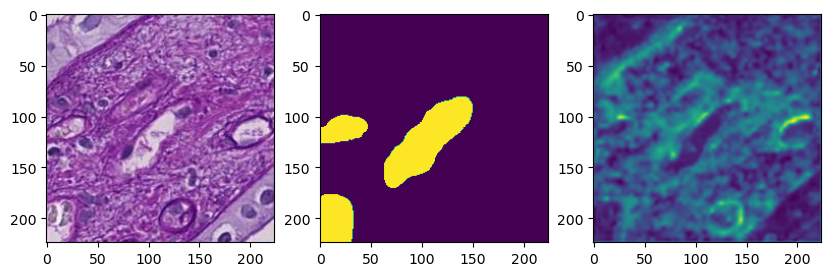

3m 8s
##################################################
Epoch 2/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.849912 || dice: 0.782567 || diceBCE: 1.109102 || IoU: 0.129595 || FT: 0.739409 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.364467 || dice: 0.986020 || diceBCE: 1.379058 || IoU: 0.007296 || FT: 0.974006 ||
--------------------------------------------------


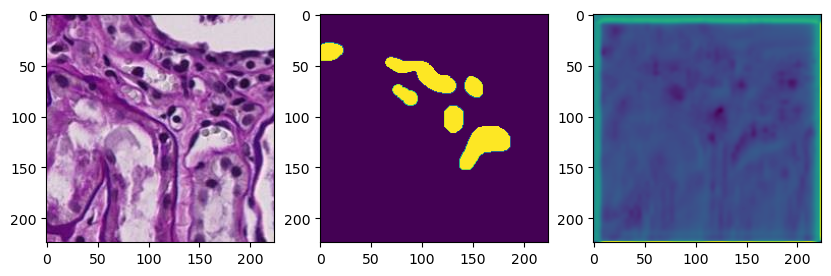

3m 4s
##################################################
Epoch 3/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.723873 || dice: 0.727869 || diceBCE: 1.060842 || IoU: 0.168484 || FT: 0.667842 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.489740 || dice: 0.995210 || diceBCE: 1.495270 || IoU: 0.002765 || FT: 0.989063 ||
--------------------------------------------------


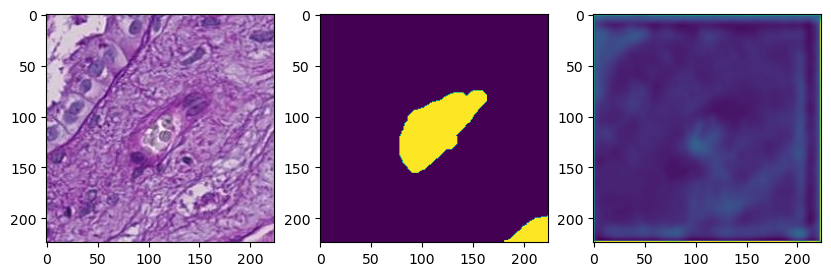

3m 4s
##################################################
Epoch 4/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.585271 || dice: 0.674879 || diceBCE: 1.004749 || IoU: 0.209739 || FT: 0.602901 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.674524 || dice: 0.813560 || diceBCE: 1.907149 || IoU: 0.116313 || FT: 0.777745 ||
--------------------------------------------------


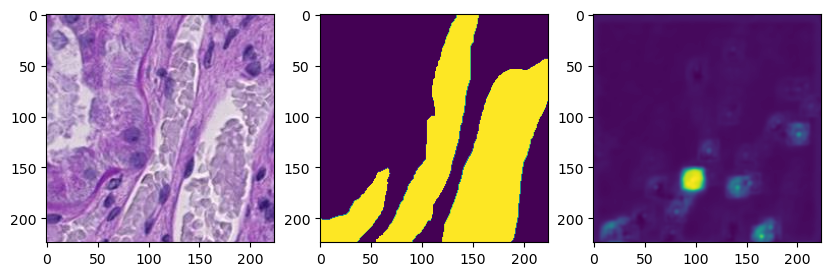

3m 4s
##################################################
Epoch 5/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.514391 || dice: 0.646084 || diceBCE: 0.983513 || IoU: 0.234561 || FT: 0.569560 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.121813 || dice: 0.761027 || diceBCE: 1.429350 || IoU: 0.153769 || FT: 0.719948 ||
--------------------------------------------------


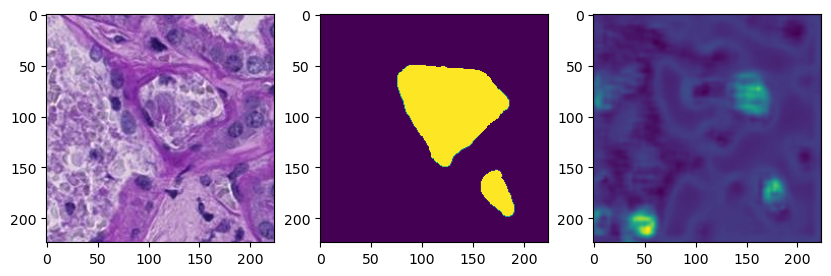

3m 3s
##################################################
Epoch 6/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.429207 || dice: 0.619613 || diceBCE: 0.943944 || IoU: 0.257369 || FT: 0.539749 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.003405 || dice: 0.830425 || diceBCE: 1.217668 || IoU: 0.107131 || FT: 0.766523 ||
--------------------------------------------------


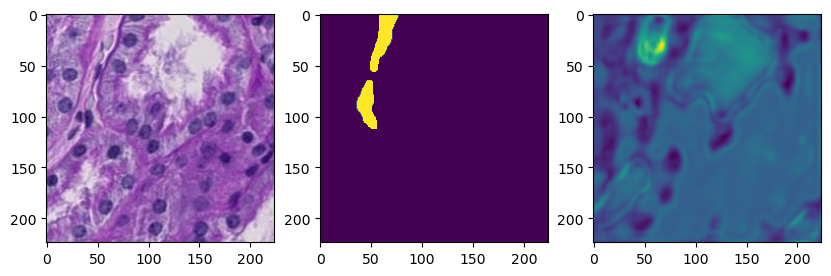

3m 2s
##################################################
Epoch 7/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.357990 || dice: 0.588737 || diceBCE: 0.921682 || IoU: 0.281846 || FT: 0.502752 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.668099 || dice: 0.699891 || diceBCE: 1.079944 || IoU: 0.205922 || FT: 0.630448 ||
--------------------------------------------------


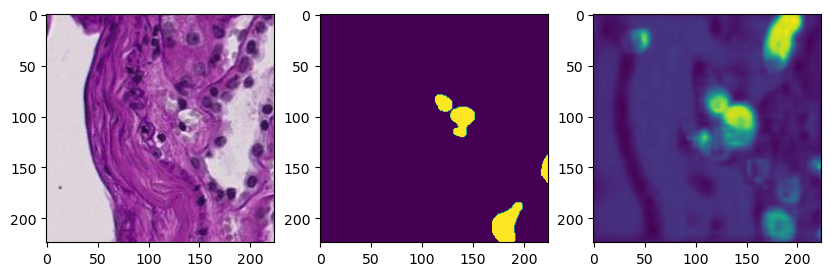

2m 59s
##################################################
Epoch 8/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.294529 || dice: 0.571868 || diceBCE: 0.891679 || IoU: 0.298575 || FT: 0.486314 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.665719 || dice: 0.711947 || diceBCE: 1.066376 || IoU: 0.200329 || FT: 0.637978 ||
--------------------------------------------------


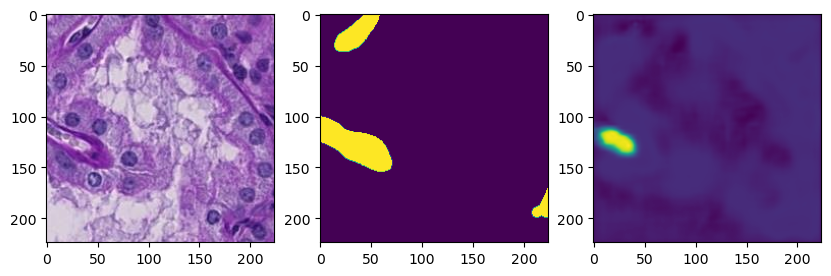

2m 60s
##################################################
Epoch 9/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.261827 || dice: 0.563836 || diceBCE: 0.874664 || IoU: 0.306419 || FT: 0.477710 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.763770 || dice: 0.710575 || diceBCE: 1.150659 || IoU: 0.193445 || FT: 0.662277 ||
--------------------------------------------------


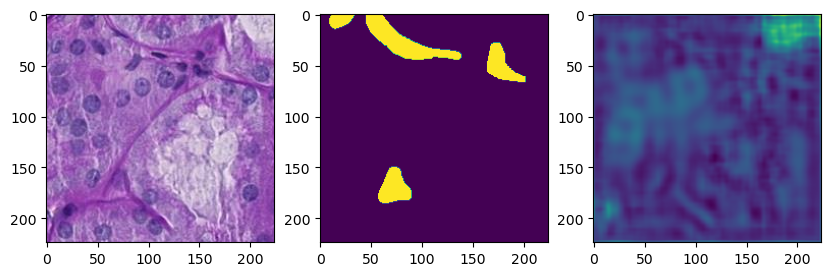

3m 1s
##################################################
Epoch 10/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.202232 || dice: 0.548765 || diceBCE: 0.839705 || IoU: 0.318736 || FT: 0.461814 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.921821 || dice: 0.761152 || diceBCE: 1.244278 || IoU: 0.161229 || FT: 0.690522 ||
--------------------------------------------------


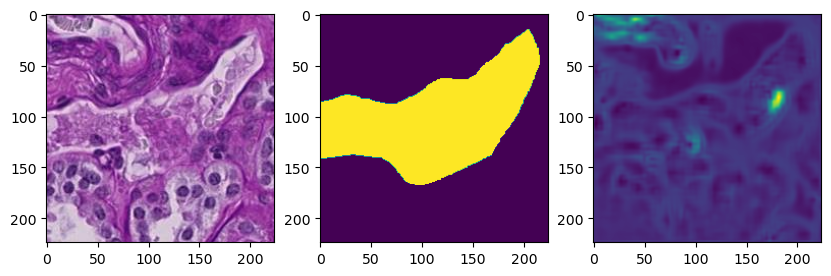

2m 59s
##################################################
Epoch 11/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.198226 || dice: 0.540978 || diceBCE: 0.850682 || IoU: 0.326228 || FT: 0.451816 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.482216 || dice: 0.637540 || diceBCE: 0.990602 || IoU: 0.254193 || FT: 0.568310 ||
--------------------------------------------------


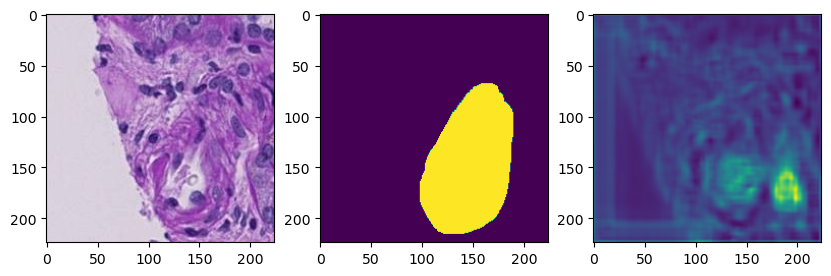

2m 58s
##################################################
Epoch 12/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.173658 || dice: 0.530985 || diceBCE: 0.842395 || IoU: 0.334369 || FT: 0.441943 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.554157 || dice: 0.646927 || diceBCE: 1.045812 || IoU: 0.245828 || FT: 0.582417 ||
--------------------------------------------------


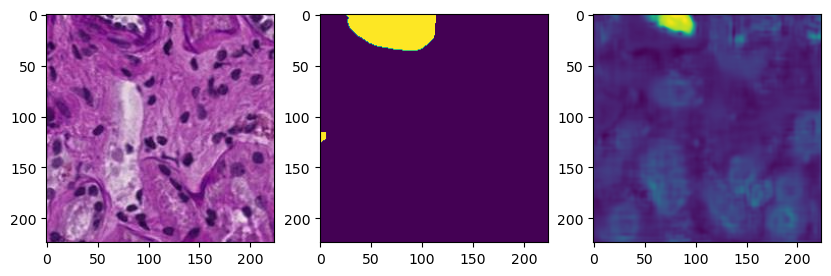

3m 1s
##################################################
Epoch 13/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.094151 || dice: 0.505595 || diceBCE: 0.809756 || IoU: 0.357803 || FT: 0.415531 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.521822 || dice: 0.660446 || diceBCE: 1.008909 || IoU: 0.243544 || FT: 0.584668 ||
--------------------------------------------------


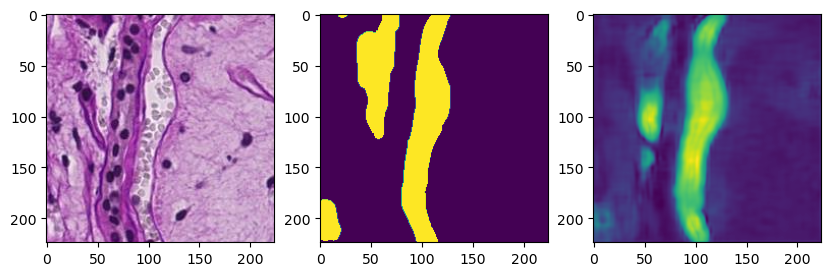

2m 59s
##################################################
Epoch 14/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.050094 || dice: 0.496322 || diceBCE: 0.783944 || IoU: 0.366925 || FT: 0.406831 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.534967 || dice: 0.650271 || diceBCE: 1.037646 || IoU: 0.251339 || FT: 0.571218 ||
--------------------------------------------------


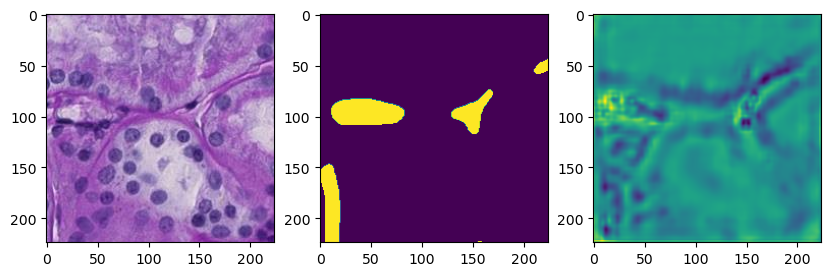

2m 58s
##################################################
Epoch 15/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.025918 || dice: 0.486865 || diceBCE: 0.778149 || IoU: 0.376116 || FT: 0.397292 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.578443 || dice: 0.668671 || diceBCE: 1.049971 || IoU: 0.235764 || FT: 0.579764 ||
--------------------------------------------------


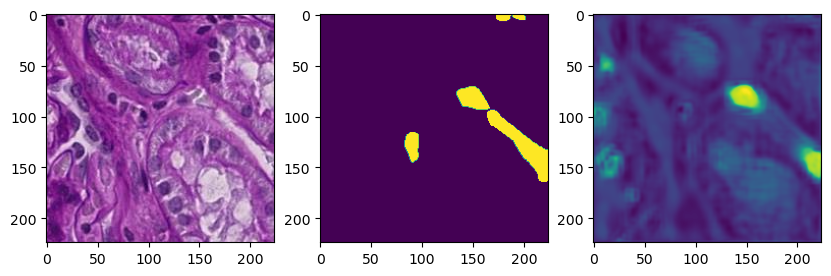

2m 57s
##################################################
Epoch 16/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.999072 || dice: 0.481762 || diceBCE: 0.759176 || IoU: 0.380052 || FT: 0.391985 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.283990 || dice: 0.575377 || diceBCE: 0.898038 || IoU: 0.307024 || FT: 0.485482 ||
--------------------------------------------------


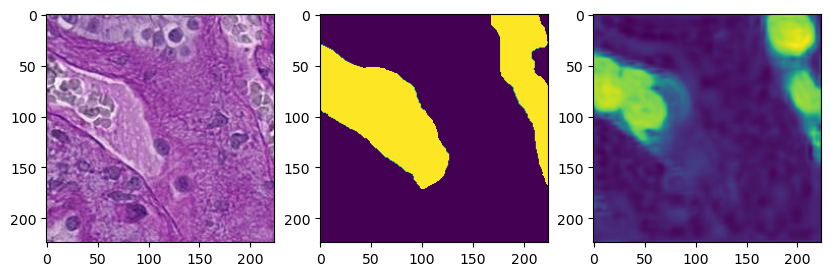

2m 56s
##################################################
Epoch 17/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.981031 || dice: 0.472395 || diceBCE: 0.759099 || IoU: 0.389034 || FT: 0.383070 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.307694 || dice: 0.580416 || diceBCE: 0.915650 || IoU: 0.303978 || FT: 0.491526 ||
--------------------------------------------------


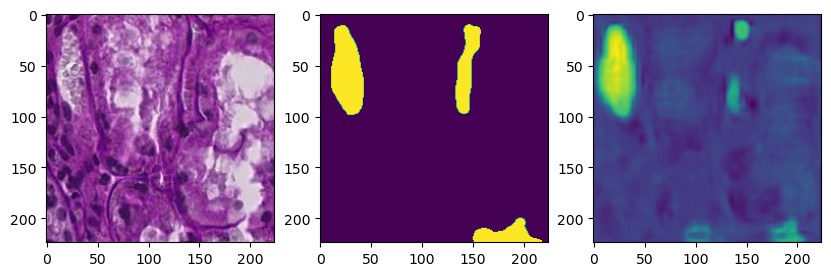

3m 2s
##################################################
Epoch 18/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.956960 || dice: 0.469772 || diceBCE: 0.739655 || IoU: 0.391348 || FT: 0.380857 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.289917 || dice: 0.578914 || diceBCE: 0.894543 || IoU: 0.302313 || FT: 0.500853 ||
--------------------------------------------------


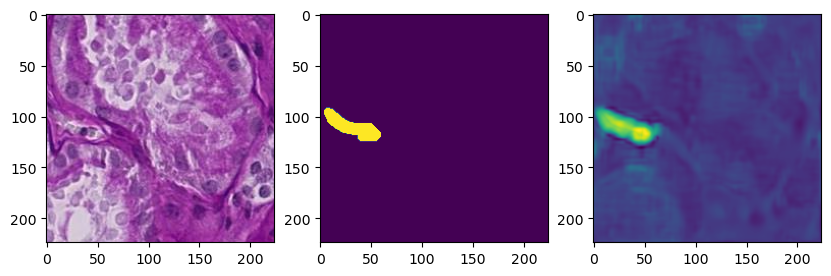

3m 0s
##################################################
Epoch 19/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.970313 || dice: 0.469347 || diceBCE: 0.754544 || IoU: 0.392116 || FT: 0.380277 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.257772 || dice: 0.565407 || diceBCE: 0.890089 || IoU: 0.316159 || FT: 0.481573 ||
--------------------------------------------------


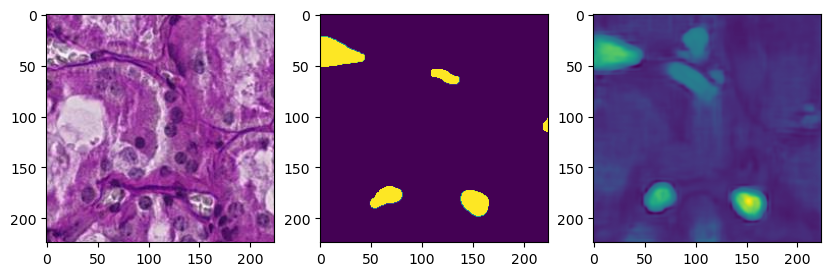

2m 58s
##################################################
Epoch 20/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.922069 || dice: 0.458864 || diceBCE: 0.726081 || IoU: 0.402006 || FT: 0.368400 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.308656 || dice: 0.583014 || diceBCE: 0.909498 || IoU: 0.300421 || FT: 0.499739 ||
--------------------------------------------------


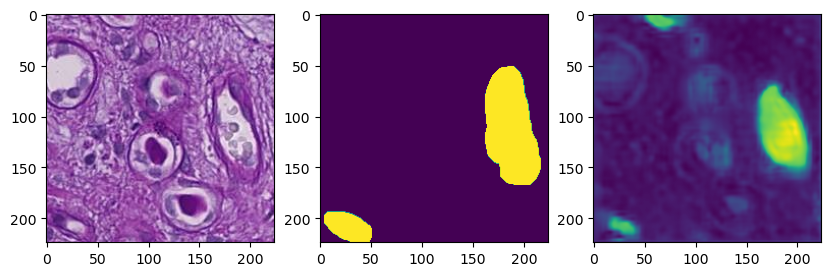

2m 57s
##################################################
Best validation loss: 0.481573


In [46]:
model = train(CaFormerV1, 'CaformerV1', "SHdataset/labeled", epochs=20, classes = [0])

In [49]:
metrics = model[1]
train_loss = [metrics['train'][i]['loss']/1306.0 for i in range(len(metrics['train']))]
train_FT = [metrics['train'][i]['FT']/1306. for i in range(len(metrics['train']))]
train_IoU = [metrics['train'][i]['IoU']/1306.0 for i in range(len(metrics['train']))]
train_dice = [metrics['train'][i]['dice']/1306.0 for i in range(len(metrics['train']))]
train_diceBCE = [metrics['train'][i]['diceBCE']/1306.0 for i in range(len(metrics['train']))]

val_loss = [metrics['val'][i]['loss']/327 for i in range(len(metrics['val']))]
val_FT = [metrics['val'][i]['FT']/327 for i in range(len(metrics['val']))]
val_IoU = [metrics['val'][i]['IoU']/327 for i in range(len(metrics['val']))]
val_dice = [metrics['val'][i]['dice']/327 for i in range(len(metrics['val']))]
val_diceBCE = [metrics['val'][i]['diceBCE']/327 for i in range(len(metrics['val']))]


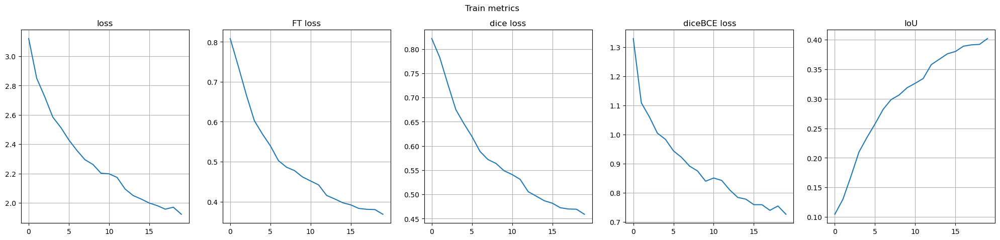

In [50]:
fig, ax = plt.subplots(1,5, figsize = (25,5))
fig.suptitle("Train metrics")
titles = ["loss", "FT loss", "dice loss", "diceBCE loss", "IoU"]
for a in range(len(ax)):
    ax[a].grid()
    ax[a].set_title(titles[a])
    
ax[0].plot(range(0,20), train_loss)
ax[1].plot(range(0,20), train_FT)
ax[2].plot(range(0,20), train_dice)
ax[3].plot(range(0,20), train_diceBCE)
ax[4].plot(range(0,20), train_IoU)
plt.show()

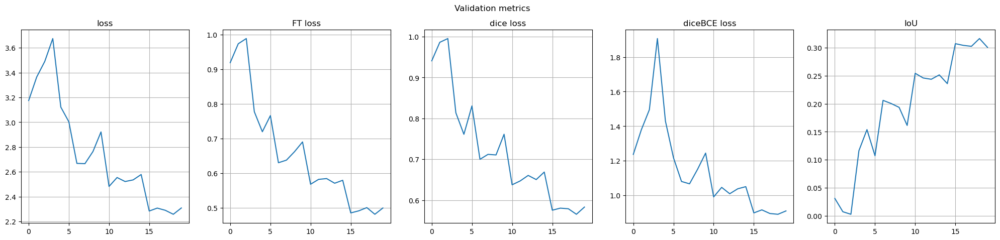

In [52]:
fig, ax = plt.subplots(1,5, figsize = (25,5))
fig.suptitle("Validation metrics")
titles = ["loss", "FT loss", "dice loss", "diceBCE loss", "IoU"]
for a in range(len(ax)):
    ax[a].grid()
    ax[a].set_title(titles[a])
    
ax[0].plot(range(0,20), val_loss)
ax[1].plot(range(0,20), val_FT)
ax[2].plot(range(0,20), val_dice)
ax[3].plot(range(0,20), val_diceBCE)
ax[4].plot(range(0,20), val_IoU)
plt.show()

In [47]:
#CaFormerv2

class CaFormerV2(nn.Module):
    def __init__(self, in_channels = 3, num_classes = 1, dims = [64, 128, 320, 512],
                 reg_max = 16):
        super().__init__()
        self.in_channels = in_channels
        self.dims = dims
        self.reg_max = reg_max

        ###
        backbone = mb.caformer_s18(pretrained=True)
        self.downsamples = list(backbone.children())[0]
        self.metaformers = list(backbone.children())[1]

        self.convfs = nn.ModuleList()
        for i in range(len(dims)):
            self.convfs.append(Convformer(dims[i]))

        self.connector_2_1 = Connector(dims[3]+dims[2],dims[2])
        self.connector_1_1 = Connector(dims[2]+dims[1],dims[1])
        self.connector_0_1 = Connector(dims[1]+dims[0],dims[0])
        
        self.head = Head(64, 32, 32, num_classes)

        self.up2 = up(2, mode = 'bilinear')
        self.up4 = up(4, mode = 'bilinear')

    def forward(self, input):
        skips = []
        # Encoding
        x = input
        for i in range(len(self.dims)):
            x = self.metaformers[i](self.downsamples[i](x))
            if i < len(self.dims)-1:
                skips.append(x + self.convfs[i](x))
            else:
                x = x + self.convfs[i](x)

        x = torch.cat([skips[2], self.up2(x)], dim = 3)
        con2 = self.connector_2_1(x)
        ####
        x = torch.cat([skips[1], self.up2(con2)], dim = 3)
        con1 = self.connector_1_1(x)
        ####
        x = torch.cat([skips[0], self.up2(con1)], dim = 3)
        con0 = self.connector_0_1(x)
        ### Head
        x = self.head(self.up4(con0))
        return x.permute(0, 3, 1, 2)

 ____________________________________________________________
|                          Training                          |
|____________________________________________________________|
Epoch 1/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 3.139177 || dice: 0.826533 || diceBCE: 1.340544 || IoU: 0.100684 || FT: 0.813609 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.748542 || dice: 0.761886 || diceBCE: 1.036566 || IoU: 0.144012 || FT: 0.722491 ||
--------------------------------------------------


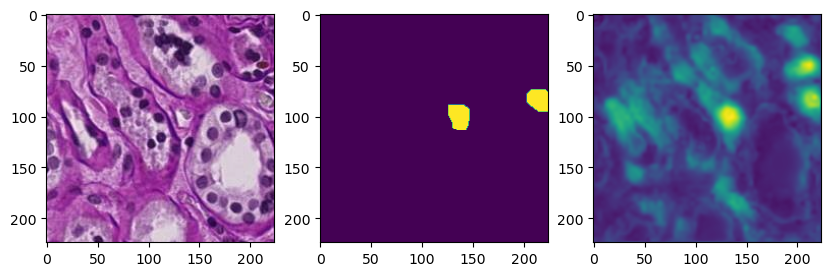

2m 54s
##################################################
Epoch 2/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.593053 || dice: 0.685824 || diceBCE: 0.995408 || IoU: 0.201177 || FT: 0.624857 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.436347 || dice: 0.950222 || diceBCE: 1.497100 || IoU: 0.030376 || FT: 0.919083 ||
--------------------------------------------------


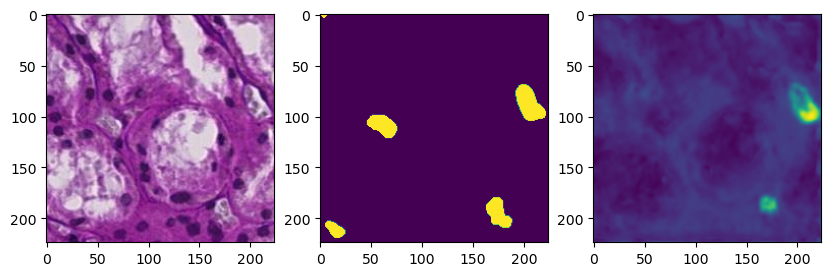

2m 55s
##################################################
Epoch 3/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.861253 || dice: 0.789602 || diceBCE: 1.121421 || IoU: 0.130084 || FT: 0.741735 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.127960 || dice: 0.913393 || diceBCE: 1.220548 || IoU: 0.046294 || FT: 0.893488 ||
--------------------------------------------------


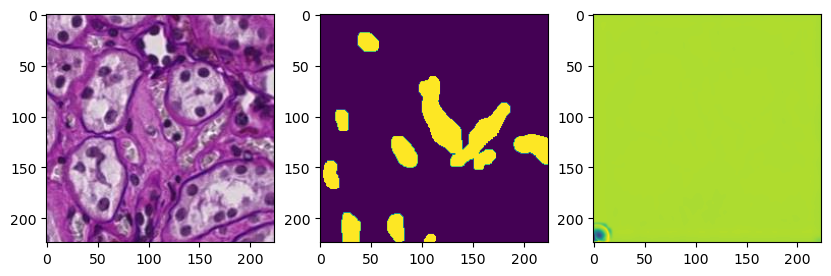

2m 51s
##################################################
Epoch 4/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 3.015941 || dice: 0.862171 || diceBCE: 1.172149 || IoU: 0.078104 || FT: 0.831542 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.311106 || dice: 0.969373 || diceBCE: 1.342652 || IoU: 0.015773 || FT: 0.950307 ||
--------------------------------------------------


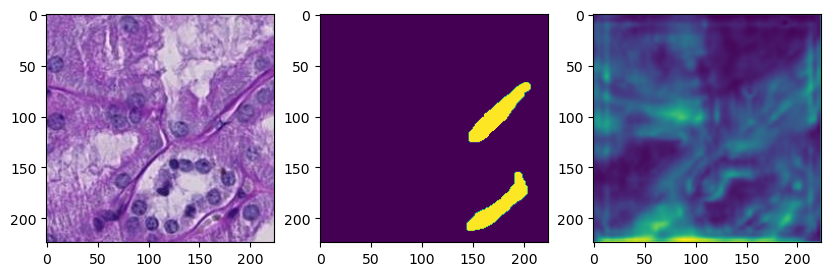

2m 52s
##################################################
Epoch 5/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.812604 || dice: 0.768110 || diceBCE: 1.093925 || IoU: 0.140661 || FT: 0.716251 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.962502 || dice: 0.751477 || diceBCE: 1.269617 || IoU: 0.153557 || FT: 0.704395 ||
--------------------------------------------------


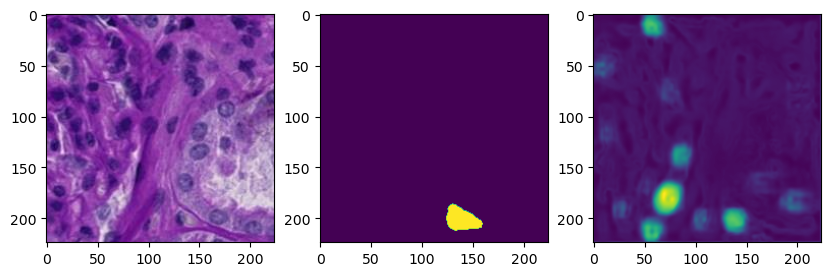

2m 50s
##################################################
Epoch 6/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.674979 || dice: 0.709079 || diceBCE: 1.041188 || IoU: 0.183104 || FT: 0.641450 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.731090 || dice: 0.724562 || diceBCE: 1.090078 || IoU: 0.179494 || FT: 0.645811 ||
--------------------------------------------------


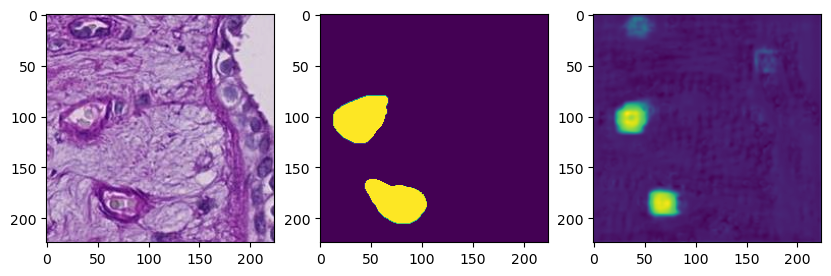

2m 54s
##################################################
Epoch 7/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.566996 || dice: 0.666484 || diceBCE: 1.000219 || IoU: 0.216611 || FT: 0.590556 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.784856 || dice: 0.715667 || diceBCE: 1.150779 || IoU: 0.182961 || FT: 0.651985 ||
--------------------------------------------------


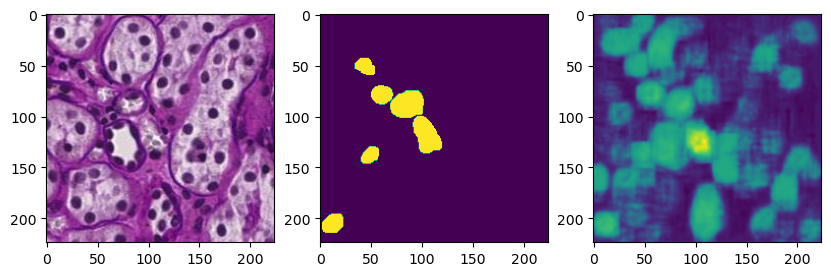

2m 52s
##################################################
Epoch 8/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.490341 || dice: 0.640464 || diceBCE: 0.964361 || IoU: 0.237010 || FT: 0.560454 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.844180 || dice: 0.772461 || diceBCE: 1.142679 || IoU: 0.149249 || FT: 0.705995 ||
--------------------------------------------------


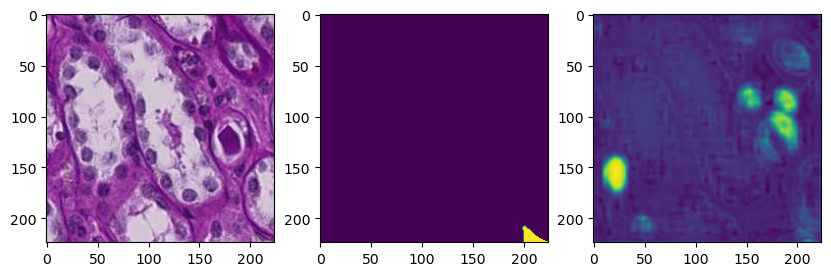

2m 50s
##################################################
Epoch 9/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.411359 || dice: 0.612183 || diceBCE: 0.936224 || IoU: 0.262432 || FT: 0.528264 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.805068 || dice: 0.702339 || diceBCE: 1.199853 || IoU: 0.197392 || FT: 0.638818 ||
--------------------------------------------------


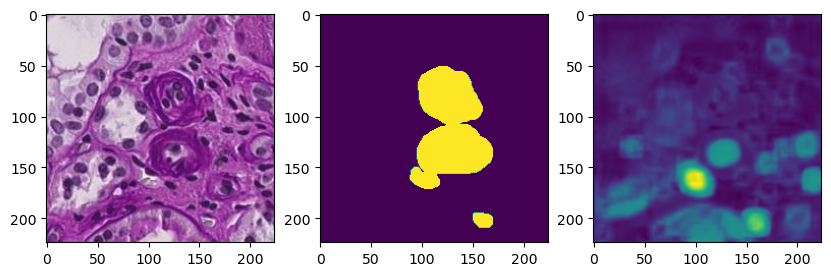

2m 50s
##################################################
Epoch 10/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.348649 || dice: 0.586207 || diceBCE: 0.916144 || IoU: 0.283747 || FT: 0.497924 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.093188 || dice: 0.834251 || diceBCE: 1.311852 || IoU: 0.109332 || FT: 0.765683 ||
--------------------------------------------------


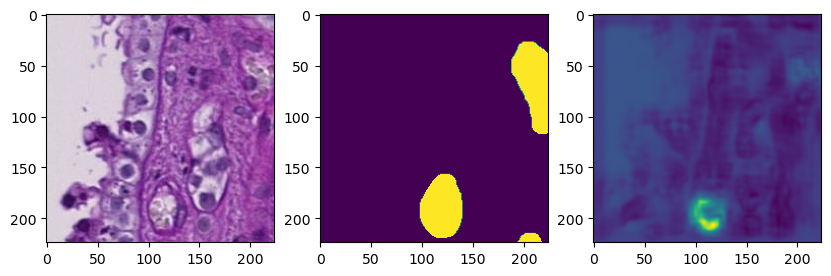

2m 52s
##################################################
Epoch 11/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.285387 || dice: 0.570470 || diceBCE: 0.881596 || IoU: 0.298104 || FT: 0.483381 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.693100 || dice: 0.697406 || diceBCE: 1.097837 || IoU: 0.202368 || FT: 0.627023 ||
--------------------------------------------------


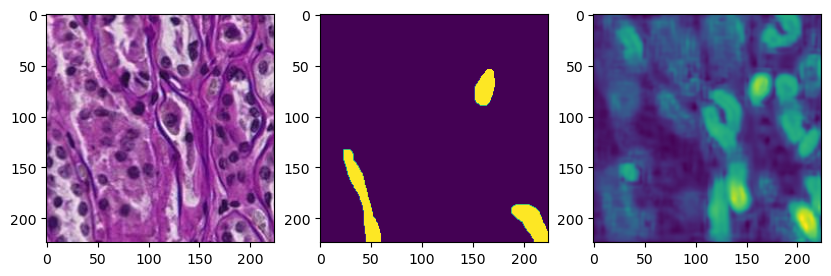

2m 58s
##################################################
Epoch 12/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.232438 || dice: 0.554015 || diceBCE: 0.859290 || IoU: 0.313426 || FT: 0.464084 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.717861 || dice: 0.696850 || diceBCE: 1.130399 || IoU: 0.206269 || FT: 0.635990 ||
--------------------------------------------------


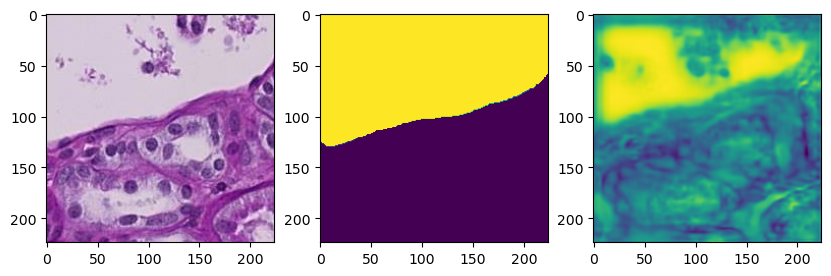

2m 55s
##################################################
Epoch 13/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.207538 || dice: 0.543141 || diceBCE: 0.856110 || IoU: 0.324286 || FT: 0.454257 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.668846 || dice: 0.679627 || diceBCE: 1.096157 || IoU: 0.213655 || FT: 0.600436 ||
--------------------------------------------------


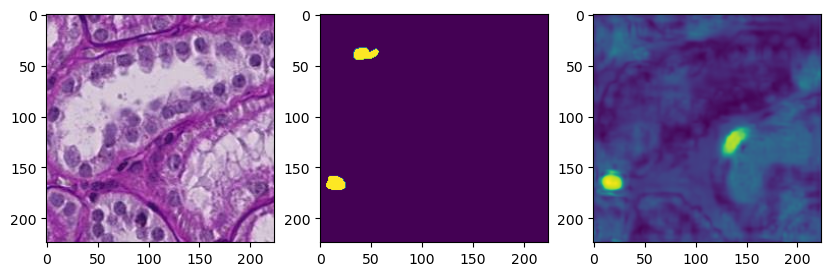

2m 54s
##################################################
Epoch 14/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.140552 || dice: 0.525470 || diceBCE: 0.821408 || IoU: 0.340428 || FT: 0.434762 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.653259 || dice: 0.674663 || diceBCE: 1.111090 || IoU: 0.228915 || FT: 0.591504 ||
--------------------------------------------------


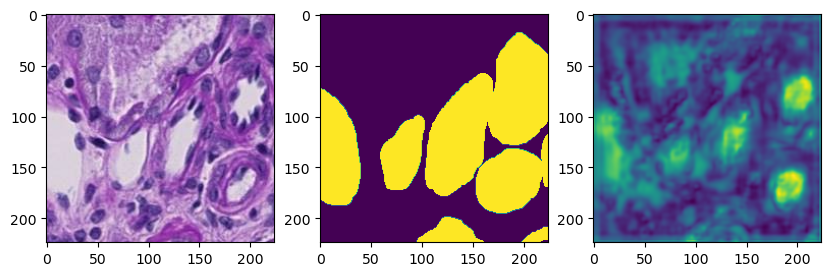

2m 50s
##################################################
Epoch 15/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.107197 || dice: 0.516235 || diceBCE: 0.802203 || IoU: 0.347503 || FT: 0.426482 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.541058 || dice: 0.662178 || diceBCE: 1.004707 || IoU: 0.231825 || FT: 0.590553 ||
--------------------------------------------------


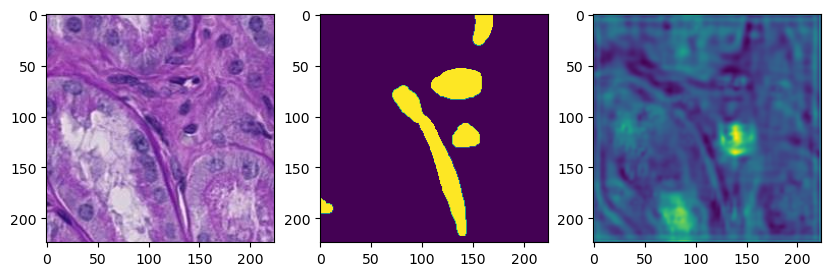

2m 50s
##################################################
Epoch 16/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.064853 || dice: 0.502500 || diceBCE: 0.787868 || IoU: 0.361508 || FT: 0.411304 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.585079 || dice: 0.660359 || diceBCE: 1.059988 || IoU: 0.237454 || FT: 0.585803 ||
--------------------------------------------------


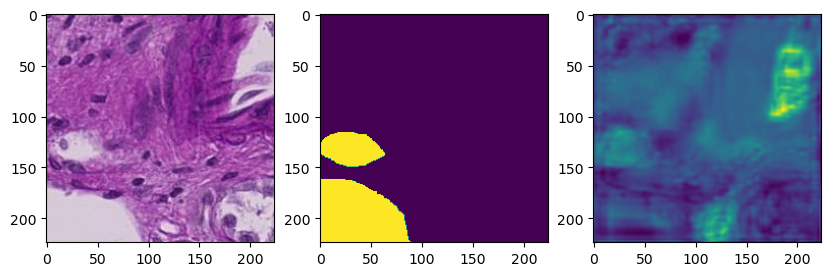

2m 51s
##################################################
Epoch 17/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.007751 || dice: 0.486710 || diceBCE: 0.757506 || IoU: 0.374877 || FT: 0.395458 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.578040 || dice: 0.658721 || diceBCE: 1.054556 || IoU: 0.238258 || FT: 0.580353 ||
--------------------------------------------------


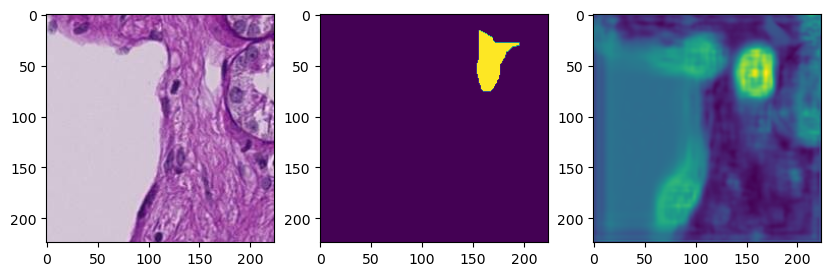

2m 49s
##################################################
Epoch 18/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.005291 || dice: 0.488088 || diceBCE: 0.754829 || IoU: 0.374769 || FT: 0.398069 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.542525 || dice: 0.645253 || diceBCE: 1.044006 || IoU: 0.250741 || FT: 0.556675 ||
--------------------------------------------------


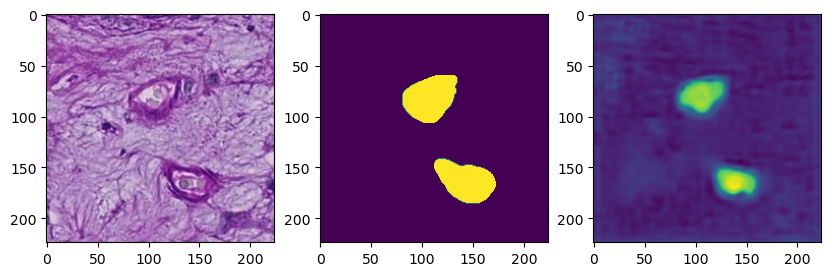

2m 50s
##################################################
Epoch 19/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.991857 || dice: 0.479646 || diceBCE: 0.755789 || IoU: 0.381966 || FT: 0.388001 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.571290 || dice: 0.660206 || diceBCE: 1.055958 || IoU: 0.242334 || FT: 0.575862 ||
--------------------------------------------------


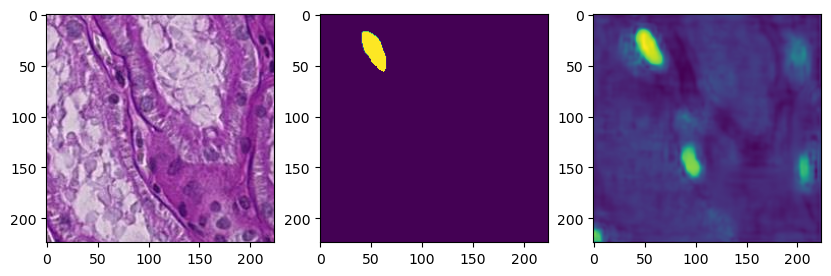

2m 53s
##################################################
Epoch 20/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.985872 || dice: 0.483087 || diceBCE: 0.744747 || IoU: 0.379437 || FT: 0.393944 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.561993 || dice: 0.646485 || diceBCE: 1.057378 || IoU: 0.247692 || FT: 0.568790 ||
--------------------------------------------------


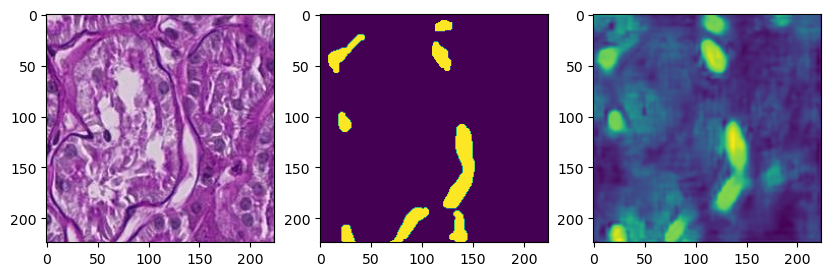

2m 54s
##################################################
Best validation loss: 0.556675


In [48]:
model2 = train(CaFormerV2, 'CaformerV2', "SHdataset/labeled", classes = [0])

In [53]:
metrics = model2[1]
train_loss = [metrics['train'][i]['loss']/1306.0 for i in range(len(metrics['train']))]
train_FT = [metrics['train'][i]['FT']/1306. for i in range(len(metrics['train']))]
train_IoU = [metrics['train'][i]['IoU']/1306.0 for i in range(len(metrics['train']))]
train_dice = [metrics['train'][i]['dice']/1306.0 for i in range(len(metrics['train']))]
train_diceBCE = [metrics['train'][i]['diceBCE']/1306.0 for i in range(len(metrics['train']))]

val_loss = [metrics['val'][i]['loss']/327 for i in range(len(metrics['val']))]
val_FT = [metrics['val'][i]['FT']/327 for i in range(len(metrics['val']))]
val_IoU = [metrics['val'][i]['IoU']/327 for i in range(len(metrics['val']))]
val_dice = [metrics['val'][i]['dice']/327 for i in range(len(metrics['val']))]
val_diceBCE = [metrics['val'][i]['diceBCE']/327 for i in range(len(metrics['val']))]

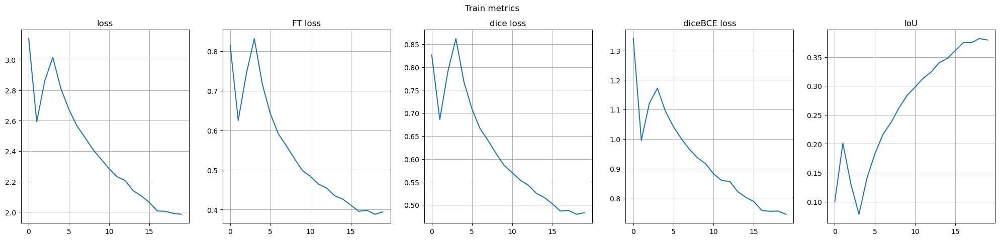

In [54]:
fig, ax = plt.subplots(1,5, figsize = (25,5))
fig.suptitle("Train metrics")
titles = ["loss", "FT loss", "dice loss", "diceBCE loss", "IoU"]
for a in range(len(ax)):
    ax[a].grid()
    ax[a].set_title(titles[a])
    
ax[0].plot(range(0,20), train_loss)
ax[1].plot(range(0,20), train_FT)
ax[2].plot(range(0,20), train_dice)
ax[3].plot(range(0,20), train_diceBCE)
ax[4].plot(range(0,20), train_IoU)
plt.show()

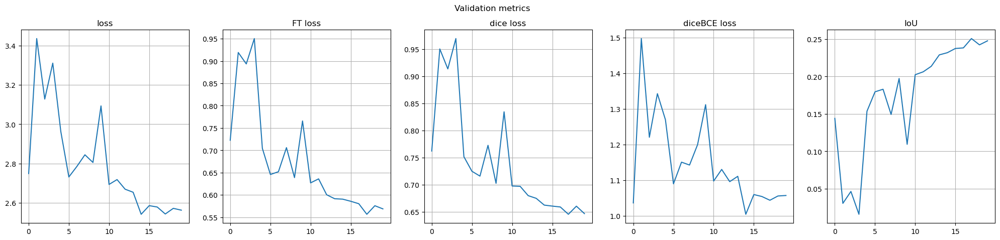

In [55]:
fig, ax = plt.subplots(1,5, figsize = (25,5))
fig.suptitle("Validation metrics")
titles = ["loss", "FT loss", "dice loss", "diceBCE loss", "IoU"]
for a in range(len(ax)):
    ax[a].grid()
    ax[a].set_title(titles[a])
    
ax[0].plot(range(0,20), val_loss)
ax[1].plot(range(0,20), val_FT)
ax[2].plot(range(0,20), val_dice)
ax[3].plot(range(0,20), val_diceBCE)
ax[4].plot(range(0,20), val_IoU)
plt.show()

In [58]:
class Connector(nn.Module):
    def __init__(self, dim_in, dim_out):
        super().__init__()
        self.pwconv = nn.Linear(dim_in, dim_out, bias=False)
        self.bnorm = nn.BatchNorm2d(dim_out)
        self.activation = nn.ReLU()
    def forward(self, input):
        x = self.pwconv(input)
        x = self.bnorm(x.permute(0, 3, 1, 2))
        x = self.activation(x.permute(0, 2, 3, 1))
        return x

class Decoder(nn.Module):
    def __init__(self, in_dim, out_dim, scale_factor=2):
        super().__init__()
        self.up = nn.Upsample(scale_factor=scale_factor, mode='bicubic')
        self.pwconv = nn.Linear(in_dim, out_dim, bias=False)
        self.dwconv = nn.Conv2d(in_dim, out_dim, kernel_size=3,
                                padding='same', bias=False)

        self.activation1 = nn.ReLU()
        self.activation2 = nn.ReLU()
        self.activation3 = nn.ReLU()

        self.normalization = nn.BatchNorm2d(out_dim)

    def forward(self, input):
        x1 = self.pwconv(input)
        x2 = self.dwconv(input.permute(0,3,1,2)).permute(0, 2, 3, 1)

        x = self.activation1(x1) + self.activation2(x2)
        x = self.up(x.permute(0, 3, 1, 2))

        x = self.normalization(x)
        x = self.activation3(x.permute(0, 2, 3, 1))
        return x

class Convformer(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.norm1 = mb.LayerNormWithoutBias(dim, eps=1e-6)
        self.bnorm = nn.BatchNorm2d(dim)

        self.sepconv = mb.SepConv(dim, expansion_ratio=5,
            act1_layer=nn.ReLU6, act2_layer=nn.ReLU6,
            bias=False, kernel_size=3, padding='same')

        self.attention = mb.Attention(dim, head_dim=32, num_heads=None,
                                      qkv_bias=False, attn_drop=0.,
                                      proj_drop=0., proj_bias=False)

        self.MLP = mb.Mlp(dim, mlp_ratio=4, out_features=None,
                          act_layer=mb.StarReLU, drop=0., bias=False)

    def forward(self, input):
        x = self.norm1(input)
        x = self.sepconv(x)
        x = self.attention(x)
        x1 = x + input
        x = self.MLP(x1)
        return x + x1

class MetaFormer(nn.Module):
    def __init__(self, in_channels = 3, num_classes = 1, dims = [64, 128, 320, 512]):
        super().__init__()
        self.in_channels = in_channels
        self.dims = dims
        backbone = mb.caformer_s18(pretrained=True)
        self.downsamples = list(backbone.children())[0]
        self.metaformers = list(backbone.children())[1]

        self.convfs = nn.ModuleList()
        for i in range(len(dims)):
            self.convfs.append(Convformer(dims[i]))

        self.connectors = nn.ModuleList()
        for i in range(len(dims)-1):
            self.connectors.append(Connector(dims[i],dims[i]))
        self.connectors.insert(0, Connector(dims[1], dims[0]//2))

        self.connector_final = Connector(dims[0]//2, dims[0]//2)

        self.decoder_skip_0 = Decoder(dims[3], dims[3], scale_factor = 4)
        self.decoder_skip_1 = Decoder(dims[1], dims[1], scale_factor = 8)

        self.decoder_0 = Decoder(dims[3], dims[2], scale_factor = 2)
        self.decoder_1 = Decoder(dims[2], dims[1], scale_factor = 2)
        self.decoder_2 = Decoder(dims[1], dims[0], scale_factor = 2)
        self.decoder_3 = Decoder(dims[0], dims[0]//2, scale_factor = 4)

        ## helpers
        self.lin_1 = nn.Linear(dims[3], dims[1], bias=False)
        self.lin_2 = nn.Linear(dims[1], dims[1], bias=False)
        self.lin_3 = nn.Linear(dims[0]//2, num_classes, bias=False)

        ## activations
        self.act1 = mb.StarReLU()
        self.act2 = mb.StarReLU()

    def forward(self, input):
        skips = []
        # Encoding
        x = input
        for i in range(len(self.dims)):
            x = self.metaformers[i](self.downsamples[i](x))
            if i < len(self.dims)-1:
                skips.append(self.convfs[i](x))
            else:
                x = self.convfs[i](x)

        # Decoder level 0: upsample_feature_0: 512 -> 512 | x: 512 -> 320
        upscale_feature = self.decoder_skip_0(x)
        x = self.decoder_0(x)
        x = self.connectors[3](x + skips[2])
        ####
        x = self.decoder_1(x)
        x = self.act1(self.lin_2(x + self.act2(self.lin_1(upscale_feature))))
        x = self.connectors[2](x+skips[1])
        upscale_feature = self.decoder_skip_1(x)
        ####
        x = self.decoder_2(x)
        x = self.connectors[1](x + skips[0])
        ### Head
        upscale_feature = self.connectors[0](upscale_feature)
        x = self.decoder_3(x)
        x = self.connector_final(x + upscale_feature)
        x = self.lin_3(x)
        return x.permute(0, 3, 1, 2)

 ____________________________________________________________
|                          Training                          |
|____________________________________________________________|
Epoch 1/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 3.096704 || dice: 0.830822 || diceBCE: 1.292543 || IoU: 0.097919 || FT: 0.814436 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.972630 || dice: 0.866607 || diceBCE: 1.122203 || IoU: 0.074787 || FT: 0.827512 ||
--------------------------------------------------


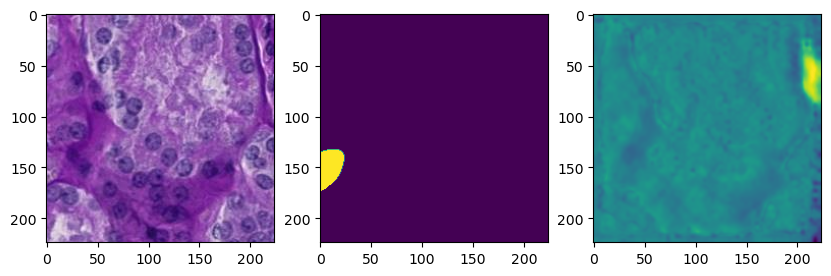

3m 5s
##################################################
Epoch 2/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.665581 || dice: 0.711366 || diceBCE: 1.031490 || IoU: 0.182954 || FT: 0.652819 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.491572 || dice: 0.662670 || diceBCE: 0.941596 || IoU: 0.225012 || FT: 0.588124 ||
--------------------------------------------------


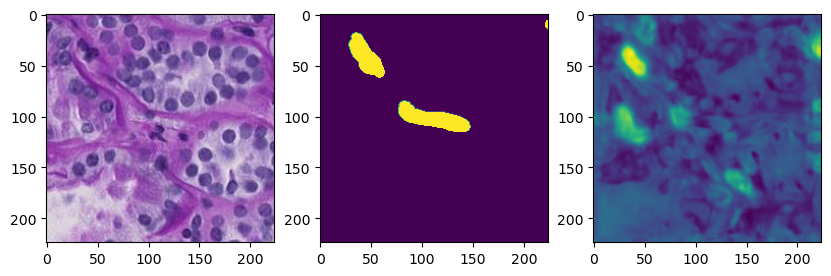

3m 3s
##################################################
Epoch 3/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.460264 || dice: 0.632065 || diceBCE: 0.952850 || IoU: 0.246293 || FT: 0.554942 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.593757 || dice: 0.689620 || diceBCE: 1.006757 || IoU: 0.206500 || FT: 0.619389 ||
--------------------------------------------------


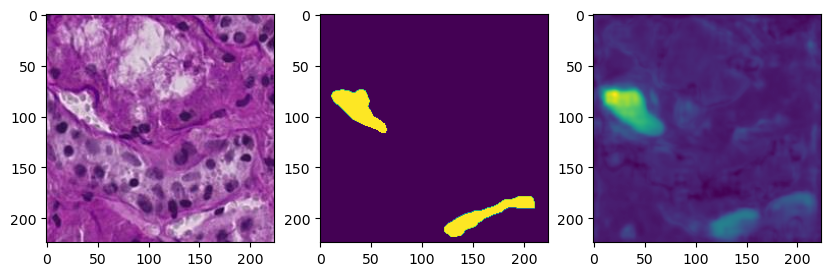

3m 4s
##################################################
Epoch 4/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.519546 || dice: 0.653724 || diceBCE: 0.979374 || IoU: 0.229914 || FT: 0.581606 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.603272 || dice: 0.693037 || diceBCE: 1.011062 || IoU: 0.203895 || FT: 0.630904 ||
--------------------------------------------------


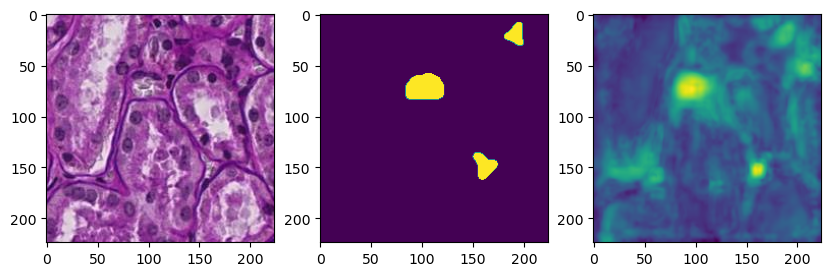

3m 3s
##################################################
Epoch 5/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.319329 || dice: 0.582578 || diceBCE: 0.896836 || IoU: 0.288753 || FT: 0.499392 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.462623 || dice: 0.632804 || diceBCE: 0.958472 || IoU: 0.247925 || FT: 0.564605 ||
--------------------------------------------------


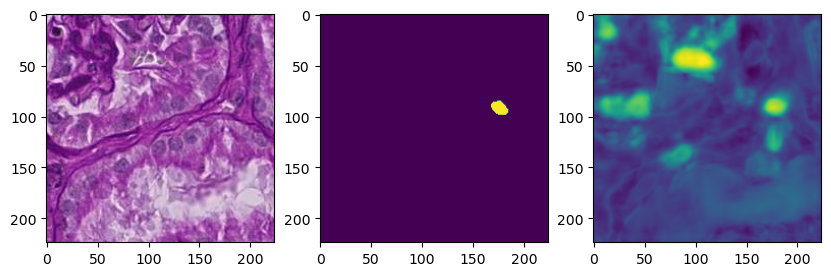

3m 8s
##################################################
Epoch 6/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.270982 || dice: 0.564415 || diceBCE: 0.880109 || IoU: 0.304563 || FT: 0.480237 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.790865 || dice: 0.646514 || diceBCE: 1.285725 || IoU: 0.247430 || FT: 0.572749 ||
--------------------------------------------------


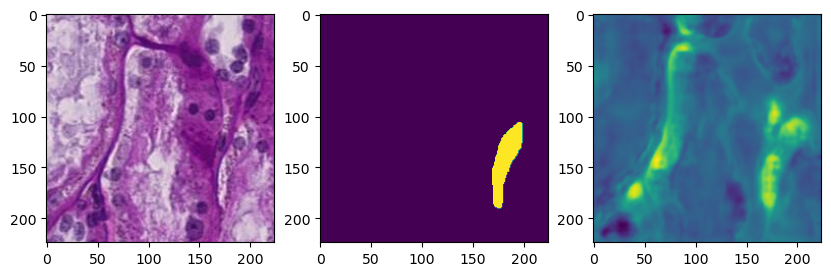

3m 8s
##################################################
Epoch 7/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.284982 || dice: 0.570610 || diceBCE: 0.886839 || IoU: 0.300928 || FT: 0.487314 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.670305 || dice: 0.901155 || diceBCE: 1.791087 || IoU: 0.060391 || FT: 0.860595 ||
--------------------------------------------------


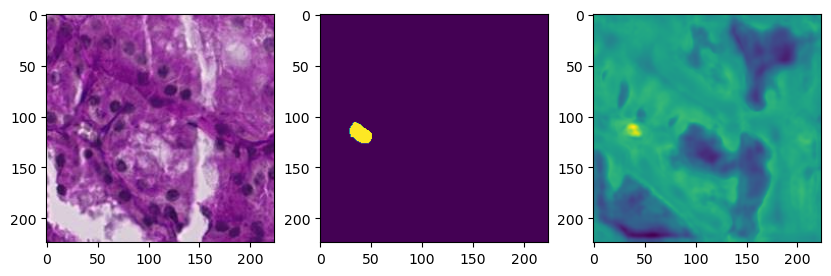

3m 4s
##################################################
Epoch 8/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.418816 || dice: 0.620381 || diceBCE: 0.929802 || IoU: 0.255493 || FT: 0.542079 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.184881 || dice: 0.796551 || diceBCE: 1.441810 || IoU: 0.128465 || FT: 0.756285 ||
--------------------------------------------------


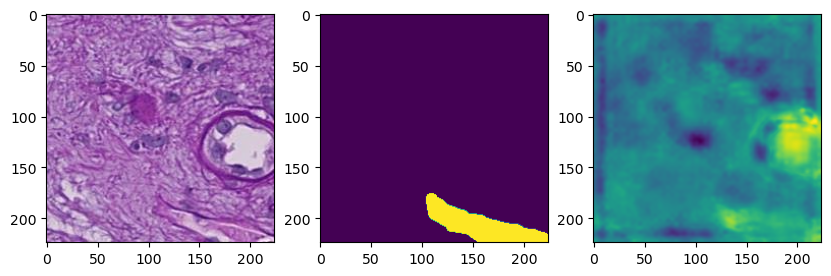

3m 3s
##################################################
Epoch 9/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.614525 || dice: 0.687579 || diceBCE: 1.026341 || IoU: 0.205908 || FT: 0.622354 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.995366 || dice: 0.822421 || diceBCE: 1.215525 || IoU: 0.110080 || FT: 0.778734 ||
--------------------------------------------------


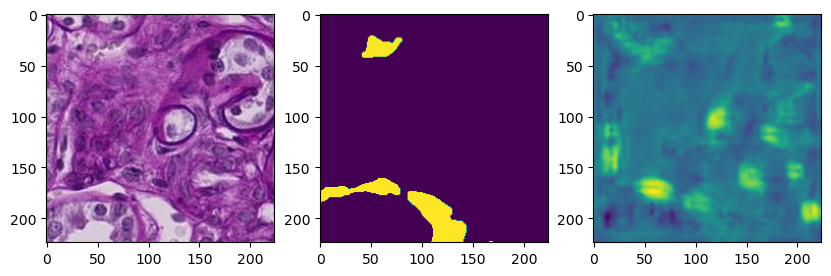

3m 2s
##################################################
Epoch 10/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.521839 || dice: 0.652685 || diceBCE: 0.977593 || IoU: 0.227877 || FT: 0.580891 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.803152 || dice: 0.730918 || diceBCE: 1.147263 || IoU: 0.172055 || FT: 0.675480 ||
--------------------------------------------------


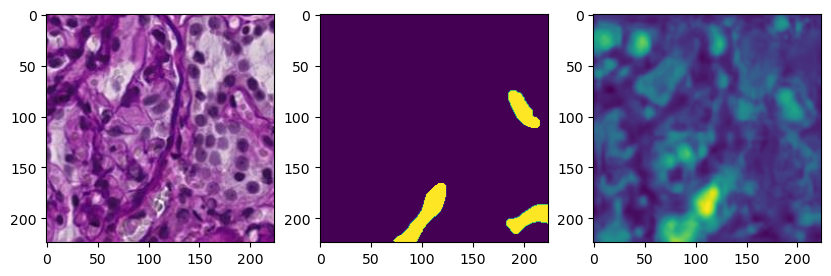

3m 3s
##################################################
Epoch 11/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.463853 || dice: 0.631971 || diceBCE: 0.961264 || IoU: 0.248706 || FT: 0.554116 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.800325 || dice: 0.736347 || diceBCE: 1.137086 || IoU: 0.168380 || FT: 0.671466 ||
--------------------------------------------------


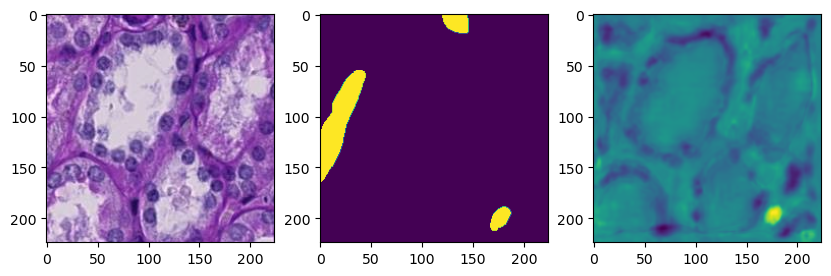

3m 5s
##################################################
Epoch 12/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.337053 || dice: 0.589854 || diceBCE: 0.903888 || IoU: 0.283418 || FT: 0.508479 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 3.344284 || dice: 0.828362 || diceBCE: 1.547911 || IoU: 0.101813 || FT: 0.775028 ||
--------------------------------------------------


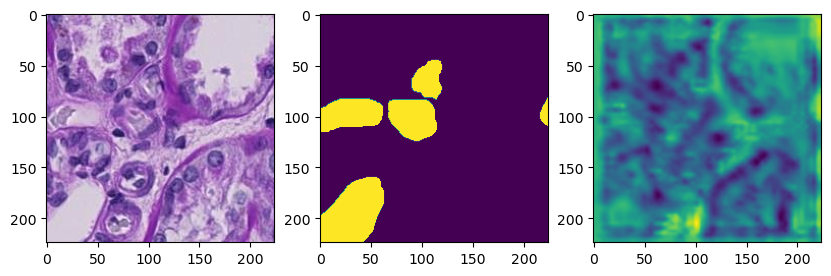

3m 6s
##################################################
Epoch 13/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.443426 || dice: 0.626317 || diceBCE: 0.948118 || IoU: 0.252346 || FT: 0.550338 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.986530 || dice: 0.795842 || diceBCE: 1.265467 || IoU: 0.139469 || FT: 0.736165 ||
--------------------------------------------------


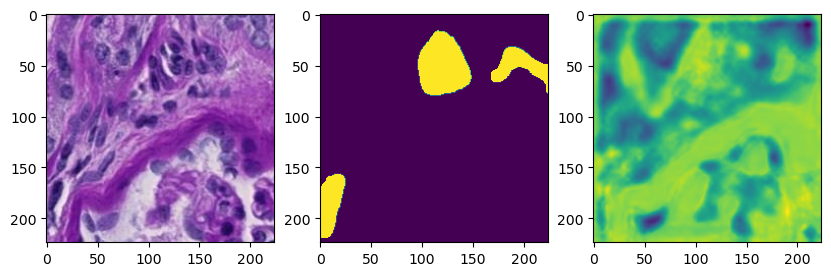

3m 5s
##################################################
Epoch 14/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.214813 || dice: 0.550412 || diceBCE: 0.851268 || IoU: 0.318228 || FT: 0.465083 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.674069 || dice: 0.696461 || diceBCE: 1.084448 || IoU: 0.205190 || FT: 0.630104 ||
--------------------------------------------------


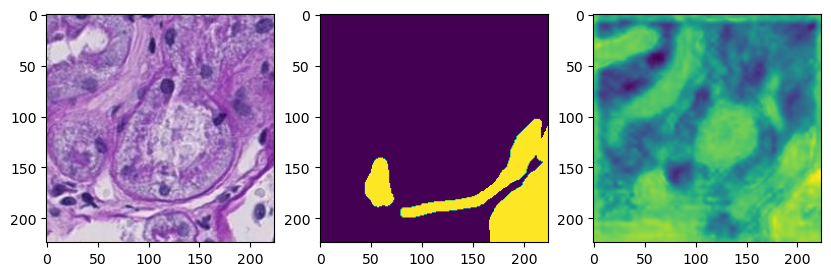

3m 7s
##################################################
Epoch 15/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.155272 || dice: 0.529223 || diceBCE: 0.830015 || IoU: 0.337372 || FT: 0.440929 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.832937 || dice: 0.722826 || diceBCE: 1.198042 || IoU: 0.182553 || FT: 0.664828 ||
--------------------------------------------------


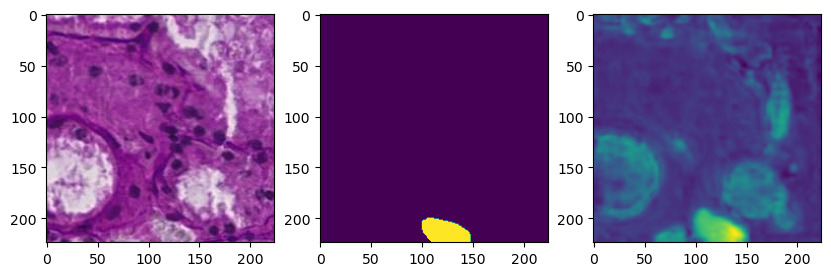

3m 10s
##################################################
Epoch 16/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.096577 || dice: 0.512908 || diceBCE: 0.799049 || IoU: 0.351236 || FT: 0.424772 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.578677 || dice: 0.667986 || diceBCE: 1.046975 || IoU: 0.234149 || FT: 0.586406 ||
--------------------------------------------------


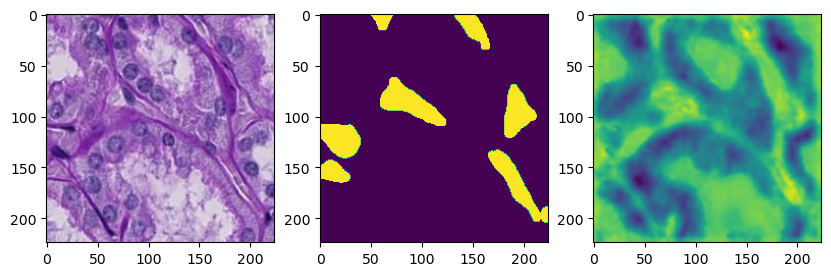

3m 8s
##################################################
Epoch 17/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.019977 || dice: 0.492269 || diceBCE: 0.761356 || IoU: 0.370689 || FT: 0.403240 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.589686 || dice: 0.671818 || diceBCE: 1.050867 || IoU: 0.230590 || FT: 0.586652 ||
--------------------------------------------------


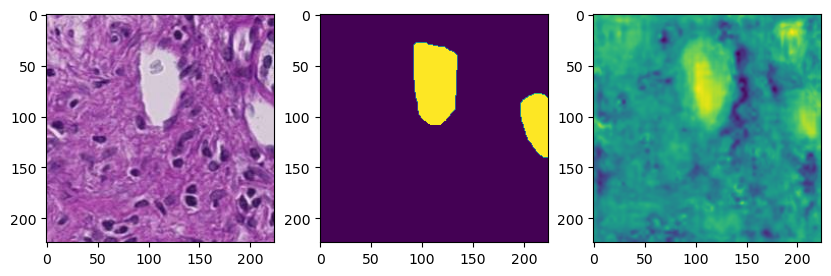

3m 6s
##################################################
Epoch 18/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.006588 || dice: 0.484106 || diceBCE: 0.765181 || IoU: 0.379297 || FT: 0.394490 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.498408 || dice: 0.640629 || diceBCE: 0.996467 || IoU: 0.249029 || FT: 0.566444 ||
--------------------------------------------------


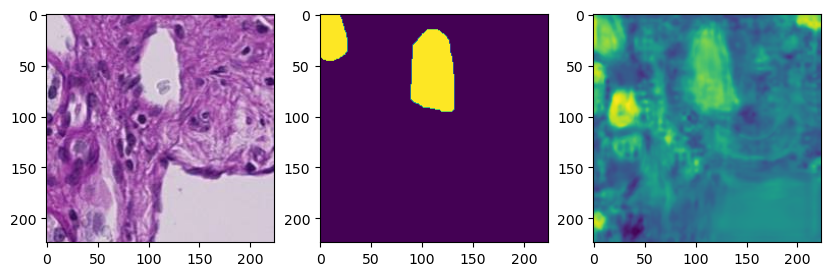

3m 6s
##################################################
Epoch 19/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 2.014392 || dice: 0.483543 || diceBCE: 0.776889 || IoU: 0.381249 || FT: 0.395412 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.524469 || dice: 0.659113 || diceBCE: 1.009973 || IoU: 0.242752 || FT: 0.579993 ||
--------------------------------------------------


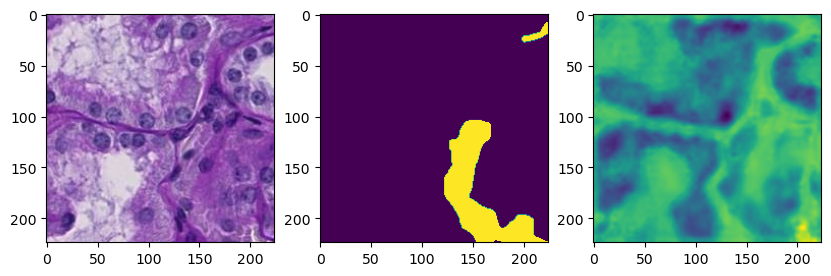

3m 9s
##################################################
Epoch 20/20: 
Phase: train


  0%|          | 0/1306 [00:00<?, ?batch/s]

train: || loss: 1.988984 || dice: 0.480958 || diceBCE: 0.752980 || IoU: 0.381998 || FT: 0.390795 ||
--------------------------------------------------
Phase: val


  0%|          | 0/327 [00:00<?, ?batch/s]

val: || loss: 2.424137 || dice: 0.619849 || diceBCE: 0.963928 || IoU: 0.269895 || FT: 0.538594 ||
--------------------------------------------------


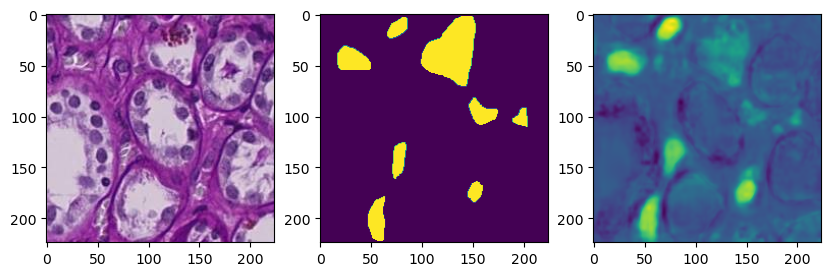

3m 8s
##################################################
Best validation loss: 0.538594


In [60]:
 model3 = train(MetaFormer, 'PolypMeta', "SHdataset/labeled", classes = [0])

In [61]:
metrics = model3[1]
train_loss = [metrics['train'][i]['loss']/1306.0 for i in range(len(metrics['train']))]
train_FT = [metrics['train'][i]['FT']/1306. for i in range(len(metrics['train']))]
train_IoU = [metrics['train'][i]['IoU']/1306.0 for i in range(len(metrics['train']))]
train_dice = [metrics['train'][i]['dice']/1306.0 for i in range(len(metrics['train']))]
train_diceBCE = [metrics['train'][i]['diceBCE']/1306.0 for i in range(len(metrics['train']))]

val_loss = [metrics['val'][i]['loss']/327 for i in range(len(metrics['val']))]
val_FT = [metrics['val'][i]['FT']/327 for i in range(len(metrics['val']))]
val_IoU = [metrics['val'][i]['IoU']/327 for i in range(len(metrics['val']))]
val_dice = [metrics['val'][i]['dice']/327 for i in range(len(metrics['val']))]
val_diceBCE = [metrics['val'][i]['diceBCE']/327 for i in range(len(metrics['val']))]

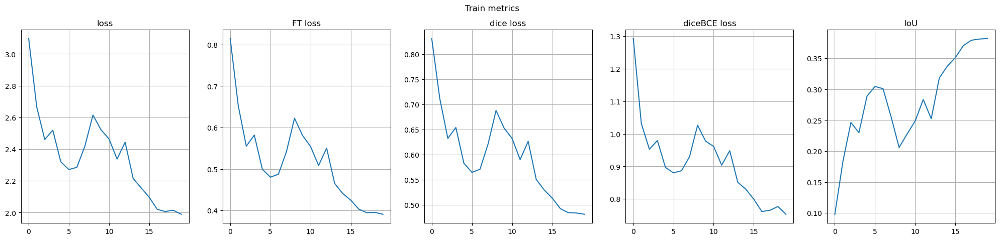

In [62]:
fig, ax = plt.subplots(1,5, figsize = (25,5))
fig.suptitle("Train metrics")
titles = ["loss", "FT loss", "dice loss", "diceBCE loss", "IoU"]
for a in range(len(ax)):
    ax[a].grid()
    ax[a].set_title(titles[a])
    
ax[0].plot(range(0,20), train_loss)
ax[1].plot(range(0,20), train_FT)
ax[2].plot(range(0,20), train_dice)
ax[3].plot(range(0,20), train_diceBCE)
ax[4].plot(range(0,20), train_IoU)
plt.show()

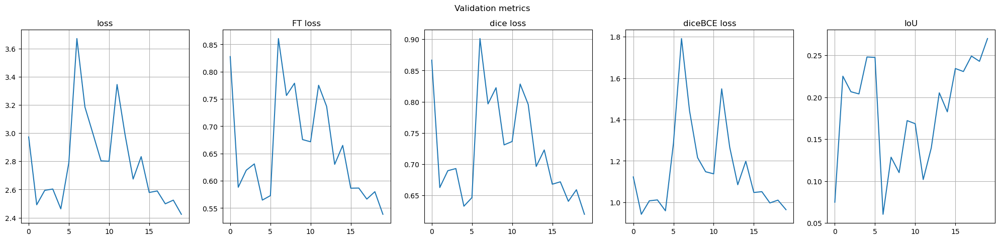

In [63]:
fig, ax = plt.subplots(1,5, figsize = (25,5))
fig.suptitle("Validation metrics")
titles = ["loss", "FT loss", "dice loss", "diceBCE loss", "IoU"]
for a in range(len(ax)):
    ax[a].grid()
    ax[a].set_title(titles[a])
    
ax[0].plot(range(0,20), val_loss)
ax[1].plot(range(0,20), val_FT)
ax[2].plot(range(0,20), val_dice)
ax[3].plot(range(0,20), val_diceBCE)
ax[4].plot(range(0,20), val_IoU)
plt.show()